# 21_1 Descriptive Analysis - Data

Let us now take a closer look on the characterisitcs of our aggregrated data.

In [1]:
# import libraries
import pandas as pd
import numpy as np
import sklearn
from datetime import datetime
import os
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
import shapely
import hashlib
import holidays
from shapely import Point, wkt
import scipy.stats
import seaborn as sns
import statsmodels.api as sm

## Load and prepare data

In [2]:
data_month_double = '07'

In [3]:
# read final data
data = pd.read_csv("../Data/20_Final_Data.csv")

/tmp/ipykernel_1792225/974816303.py:2: DtypeWarning: Columns (28) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("../../../20_Final_Data_NEW_TEST.csv")


In [4]:
tier = pd.read_parquet("../Data/12_tier_part2.parquet")
next = pd.read_parquet("../Data/15_nextbike_part2.parquet")

In [5]:
tier['trip_duration_seconds'] = tier['trip_duration'].dt.total_seconds()
next['trip_duration_seconds'] = next['trip_duration'].dt.total_seconds()

In [6]:
# transform geometry
data['station_point'] = data['station_point'].apply(wkt.loads)

In [7]:
data['buffer_zone'] = shapely.wkt.loads(data['buffer_zone'])

In [8]:
data = gpd.GeoDataFrame(data, geometry='station_point')

In [9]:
data = data.loc[:, ~data.columns.str.contains('Unnamed')]

In [10]:
#data.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.2'], inplace=True)

In [11]:
data['actual_arrival_time'] = pd.to_datetime(data['actual_arrival_time'])
data['actual_departure_time'] = pd.to_datetime(data['actual_departure_time'])
data['scheduled_arrival_time'] = pd.to_datetime(data['scheduled_arrival_time'])
data['scheduled_departure_time'] = pd.to_datetime(data['scheduled_departure_time'])

In [12]:
data = gpd.GeoDataFrame(data, geometry='buffer_zone')

In [13]:
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2564861 entries, 0 to 2564860
Data columns (total 56 columns):
 #   Column                               Dtype         
---  ------                               -----         
 0   route_id                             int64         
 1   agency_id                            int64         
 2   route_short_name                     object        
 3   route_type                           int64         
 4   route_type_name                      object        
 5   agency_name                          object        
 6   service_id                           int64         
 7   trip_id                              object        
 8   trip_headsign                        object        
 9   direction_id                         int64         
 10  shape_id                             int64         
 11  stop_id                              int64         
 12  actual_arrival_time                  datetime64[ns]
 13  actual_departure_ti

In [14]:
data['date'] = pd.to_datetime(data['date'])

In [15]:
data['arrival_delay'] = pd.to_timedelta(data['arrival_delay'])
data['departure_delay'] = pd.to_timedelta(data['departure_delay'])

In [16]:
#NEW FEATURES
data['delay_category'] = data['arrival_delay'].apply(lambda x: 1 if x > pd.Timedelta(0) else 0 if x == pd.Timedelta(0) else -1)
data['cancelled_trip'] = np.where((data['scheduled_arrival_time'].notna() & data['actual_arrival_time'].isna() & data['scheduled_departure_time'].notna() & data['actual_departure_time'].isna()), 1, 0)

## Data Description

In [17]:
# describe data
data.describe()

,route_id,agency_id,route_type,service_id,direction_id,shape_id,stop_id,actual_arrival_time,actual_departure_time,vrs_timestamp,...,departure_delay_float,actual_arrival_time_float,actual_departure_time_float,arrival_delay_span,weather_int,time_span_int_arrival,weekend,time_span_int,delay_category,cancelled_trip
count,2.564861e+06,2.564861e+06,2.564861e+06,2.564861e+06,2.564861e+06,2.564861e+06,2.564861e+06,1390757,1522668,2.564861e+06,...,1.522668e+06,2.564861e+06,2.564861e+06,2564861.0,2.564861e+06,2.564861e+06,2.564861e+06,2.564861e+06,2.564861e+06,2.564861e+06
mean,5.591188e+02,6.352416e+00,2.682092e+00,3.984507e+03,4.980925e-01,3.939255e+03,2.264040e+03,2023-07-16 17:13:37.711745792,2023-07-16 17:38:56.632778752,1.318934e+05,...,4.673649e-01,7.578822e+04,8.290391e+04,0.0,1.730815e-01,1.680874e+00,7.011850e-01,1.835310e+00,-2.084706e-01,3.920731e-01
min,1.600000e+01,1.000000e+00,0.000000e+00,3.000000e+00,0.000000e+00,6.000000e+00,4.300000e+01,2023-07-01 00:33:00,2023-07-01 00:32:00,3.080000e+02,...,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00,0.000000e+00
25%,6.010000e+02,6.000000e+00,3.000000e+00,6.400000e+01,0.000000e+00,1.945000e+03,1.210000e+03,2023-07-08 23:37:30,2023-07-09 00:00:15,8.530400e+04,...,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00,0.000000e+00
50%,6.070000e+02,6.000000e+00,3.000000e+00,6.400000e+01,0.000000e+00,2.936000e+03,1.443000e+03,2023-07-17 11:35:00,2023-07-17 11:52:00,1.318040e+05,...,2.500000e-01,6.281500e+04,8.040000e+04,0.0,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
75%,6.120000e+02,6.000000e+00,3.000000e+00,1.300000e+02,1.000000e+00,6.129000e+03,1.687000e+03,2023-07-24 11:52:15,2023-07-24 12:17:45,1.748030e+05,...,5.000000e-01,1.501400e+05,1.542000e+05,0.0,0.000000e+00,3.000000e+00,1.000000e+00,3.000000e+00,0.000000e+00,1.000000e+00
max,8.840000e+02,1.200000e+01,3.000000e+00,2.914500e+04,1.000000e+00,1.039600e+04,9.780000e+03,2023-08-01 03:24:00,2023-08-01 03:19:15,2.358070e+05,...,5.107500e+02,2.359450e+05,2.359500e+05,0.0,2.000000e+00,8.000000e+00,3.000000e+00,8.000000e+00,1.000000e+00,1.000000e+00
std,1.826850e+02,1.334552e+00,9.233959e-01,9.487887e+03,4.999965e-01,2.870713e+03,2.367512e+03,NaN,NaN,5.408360e+04,...,2.976109e+00,8.042975e+04,8.041709e+04,0.0,4.439226e-01,2.168379e+00,1.000819e+00,2.196134e+00,8.146165e-01,4.882129e-01


In [18]:
#data.to_excel("/Volumes/T7/Master/Processed Data/"+data_month_double+"/20A_Data_Description.xlsx")

### Correlation Matrix

In [19]:
# Convert non-numeric columns to numeric data type
data1 = data.apply(pd.to_numeric, errors='coerce')

# Calculate correlation matrix
correlation_matrix = data1.corr()
print(correlation_matrix)

                                     route_id  agency_id  route_short_name  \
route_id                             1.000000   0.349709          1.000000   
agency_id                            0.349709   1.000000          0.352994   
route_short_name                     1.000000   0.352994          1.000000   
route_type                           0.932745   0.118597          0.952935   
route_type_name                           NaN        NaN               NaN   
agency_name                               NaN        NaN               NaN   
service_id                          -0.565695   0.207736         -0.577786   
trip_id                                   NaN        NaN               NaN   
trip_headsign                             NaN        NaN               NaN   
direction_id                         0.017245  -0.002666          0.028049   
shape_id                            -0.181583   0.213663         -0.186743   
stop_id                              0.067866   0.022683        

In [20]:
#correlation_matrix.to_csv('/Volumes/T7/Master/Processed Data/'+data_month_double+'/20A_correlation_matrix.csv', index=False)

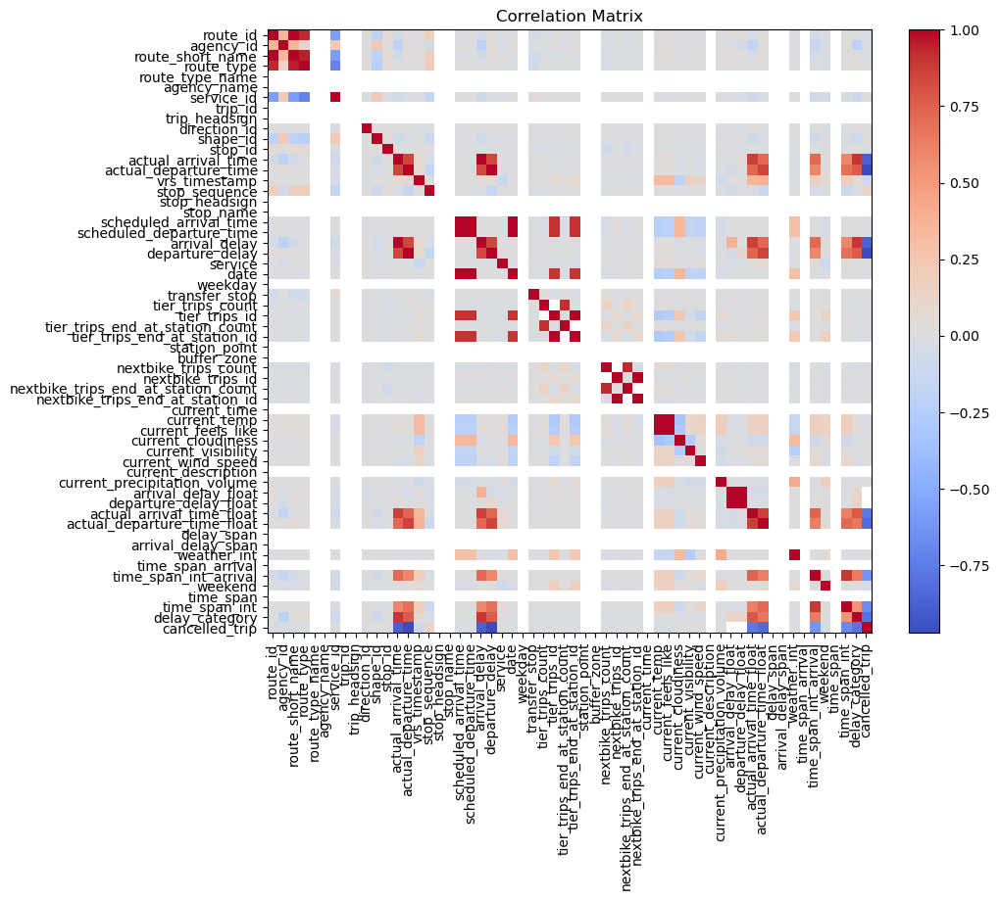

In [21]:
# Convert non-numeric columns to numeric data type
data1 = data.apply(pd.to_numeric, errors='coerce')

# Calculate correlation matrix
correlation_matrix = data1.corr()
#print(correlation_matrix)

# Create correlation matrix
correlation_matrix = correlation_matrix

# Plot correlation matrix as heatmap
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title('Correlation Matrix')

# Save the plot in high resolution
plt.savefig('correlation_matrix.png', dpi=300)

In [22]:
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2564861 entries, 0 to 2564860
Data columns (total 58 columns):
 #   Column                               Dtype          
---  ------                               -----          
 0   route_id                             int64          
 1   agency_id                            int64          
 2   route_short_name                     object         
 3   route_type                           int64          
 4   route_type_name                      object         
 5   agency_name                          object         
 6   service_id                           int64          
 7   trip_id                              object         
 8   trip_headsign                        object         
 9   direction_id                         int64          
 10  shape_id                             int64          
 11  stop_id                              int64          
 12  actual_arrival_time                  datetime64[ns] 
 13  actu

In [23]:
data['arrival_delay_float'] = data['arrival_delay'].astype(str)
data['arrival_delay_float'] = data['arrival_delay_float'].str.split(' ', n=2).str[-1]
data['arrival_delay_float'] = data['arrival_delay_float'].astype(str)
data['arrival_delay_float'] = pd.to_timedelta(data['arrival_delay_float'])
data['arrival_delay_float'] = pd.to_timedelta(data['arrival_delay_float']).dt.total_seconds() / 60

In [24]:
data['departure_delay_float'] = data['departure_delay'].astype(str)
data['departure_delay_float'] = data['departure_delay_float'].str.split(' ', n=2).str[-1]
data['departure_delay_float'] = data['departure_delay_float'].astype(str)
data['departure_delay_float'] = pd.to_timedelta(data['departure_delay_float'])
data['departure_delay_float'] = pd.to_timedelta(data['departure_delay_float']).dt.total_seconds() / 60

### Definition of functions

In [25]:
def calc_stats(data, column_name):

    #generated by Copilot

    sum = data[column_name].sum()

#Central Tendency

    rows = len(data.index)
    # Calculate mean (average)
    mean = data[column_name].mean()
    # Calculate median (middle value)
    median = data[column_name].median()
    # Calculate mode (most frequent value)
    mode = data[column_name].mode()
    #calc maximum
    max = data[column_name].max()
    #calc minimum
    min = data[column_name].min()

    # Calculate range
    data_range = data[column_name].max() - data[column_name].min()
    # Calculate coefficient of variation of range
    cvr = data_range / mean
    # Calculate coefficient of variation of mean
    cvm = mean / mean
    # Calculate coefficient of variation of median
    cvmed = median / mean
    # Calculate coefficient of variation of mode
    cvmode = mode / mean
    # Calculate coefficient of variation of standard deviation
   

# Variability
# Measure of how spread out the values in a data set are
    
    # Calculate standard deviation (average amount of variability in a dataset; tells how far each score lies from the mean; the larger the standard deviation, the more variable the data)
    std_dev = data[column_name].std()
    # Calculate variance (average squared deviation from the mean; square of standard deviation; units of varriance are much larger than those of a typical value in the dataset)
    variance = data[column_name].var()
    # Calculate coefficient of variation
    cv = std_dev / mean # standard deviation divided by the mean; measures the relative variability of a dataset; allows comparison of variability of datasets with different units of measurement
    # Calculate 25th percentile
    percentile_25 = data[column_name].quantile(0.25)
    # Calculate 75th percentile
    percentile_75 = data[column_name].quantile(0.75)
    # Calculate interquartile range
    iqr = percentile_75 - percentile_25 # difference between the 75th and 25th percentiles; measures the spread of the middle 50% of values in a dataset
    # Calculate coefficient of quartile deviation
    qd = iqr / (percentile_75 + percentile_25)
    # Calculate coefficient of variation of coefficient of variation
    cvcv = std_dev / mean
    # Calculate coefficient of variation of coefficient of quartile deviation
    cvqd = iqr / (percentile_75 + percentile_25)
    # Calculate coefficient of variation of range

#Measure of Shape

    # Calculate skewness - measure of how much the probability distribution of a random variable deviates from the normal distribution
    skewness = data[column_name].skew()
    
    # Calculate kurtosis
    kurtosis = data[column_name].kurtosis()

    # Calculate coefficient of skewness
    cs = skewness / std_dev
    # Calculate coefficient of kurtosis
    ck = kurtosis / std_dev
    # Calculate coefficient of variation of skewness
    cvs = skewness / std_dev
    # Calculate coefficient of variation of kurtosis
    cvk = kurtosis / std_dev
    # Calculate coefficient of variation of coefficient of skewness
    cvcs = skewness / std_dev
    # Calculate coefficient of variation of coefficient of kurtosis
    cvck = kurtosis / std_dev
    
    
    
    #return "column: " + str(column_name), "mean: " + str(mean), "median: " + str(median), "mode: " + str(mode), "std_dev: " + str(std_dev), "variance: " + str(variance), "skewness: "+ str(skewness), "kurtosis: " + str(kurtosis), "percentile_25: "+ str(percentile_25), "percentile_75: "+ str(percentile_75), "iqr: " + str(iqr), "range: "+ str(data_range), "cv"+ str(cv), "qd: "+str(qd), "cs: "+ str(cs), "ck: " + str(ck), "csv: "+ str(cvs), "cvk: "+ str(cvk), "cvcs: "+ str(cvcs), "cvck: " +str(cvck), "cvcv: "+ str(cvcv), "cvqd: "+ str (cvqd), "cvr: "+ str(cvr), "cvm: " + str(cvm), "cvmed: " + str(cvmed), "cvmode: "+ str(cvmode)

    return pd.DataFrame({'column': [column_name],
                         'number of rows': [rows],                       
                         'sum': [sum],
                         'mean': [mean],
                         'median': [median],
                         'mode': [mode],
                         'max': [max],
                         'min': [min],
                         'std_dev': [std_dev],
                         'variance': [variance],
                         'skewness': [skewness],
                         'kurtosis': [kurtosis],
                         'percentile_25': [percentile_25],
                         'percentile_75': [percentile_75],
                         'iqr': [iqr],
                         'range': [data_range],
                         'cv': [cv],
                         'qd': [qd],
                         'cs': [cs],
                         'ck': [ck],
                         'cvs': [cvs],
                         'cvk': [cvk],
                         'cvcs': [cvcs],
                         'cvck': [cvck],
                         'cvcv': [cvcv],
                         'cvqd': [cvqd],
                         'cvr': [cvr],
                         'cvm': [cvm],
                         'cvmed': [cvmed],
                         'cvmode': [cvmode]}).T

In [26]:
# create a shorter dataframe with most interesting columns - for better overview
def show_short_df(dataframe):
    delay_short = dataframe[['route_id', 'trip_id', 'stop_id', 'stop_name', 'scheduled_arrival_time', 'actual_arrival_time', 'scheduled_departure_time', 'actual_departure_time', 'arrival_delay', 'departure_delay', 'tier_trips_count', 'tier_trips_end_at_station_count', 'nextbike_trips_count', 'nextbike_trips_end_at_station_count', 'buffer_zone', 'arrival_delay_float', 'departure_delay_float']]
    return delay_short

In [27]:
# transform geometry
point_start = gpd.GeoDataFrame(geometry=gpd.GeoSeries.from_wkb(tier["start_location"], crs=4326))
point_end = gpd.GeoDataFrame(geometry=gpd.GeoSeries.from_wkb(tier["end_location"], crs=4326))
# drop geometry columns in wrong format
tier = tier.drop(columns=["start_location", "end_location"])
# replace geometry columns with correct format
tier['start_location'] = point_start
tier['end_location'] = point_end

In [28]:
# get the data from the tier / nextbike dataset
def check_micromobility_datasets(type, data):
    
    if type == 'tier':

        return_data = tier.copy()
        return_data = return_data.iloc[0:0] # empty dataframe

        for item in data['tier_trips_id'].str.split(' ').explode().dropna():   # iterate over all tier ids in the dataframe
            
            id = tier[tier['tier_trips_id'] == int(float(item))]   # get the rows with the specific id
            return_data = pd.concat([return_data, id])  # add the rows to the return dataframe

            return_data.drop_duplicates(inplace=True)
            
    if type == 'next':

        return_data = next.copy()
        return_data = return_data.iloc[0:0] # empty dataframe

        for item in data['nextbike_trips_id'].str.split(' ').explode().dropna():   # iterate over all nextbike ids in the dataframe
            
            id = next[next['nextbike_trips_id'] == int(float(item))]  # get the rows with the specific id
            return_data = pd.concat([return_data, id]) # add the rows to the return dataframe

            return_data.drop_duplicates(inplace=True)

    return return_data

In [29]:
def get_station_to_station(data, mode):
    
    if mode == 'tier':

        data = data[data['tier_trips_start_at_station_id'].notna() & data['tier_trips_end_at_station_id'].notna()]
        data = data[data['tier_trips_start_at_station_id'] != data['tier_trips_end_at_station_id']]
        data = data[data['tier_trips_start_at_station_id'] != 0]
        data = data[data['tier_trips_end_at_station_id'] != 0]
    t = check_micromobility_datasets('tier', data)
    n = check_micromobility_datasets('next', data)

    t = t[t['end_stop_id'].notna() & t['start_stop_id'].notna()]
    n = n[n['end_stop_id'].notna() & n['start_stop_id'].notna()]
    
    return t, n

In [30]:
# map the start and end locations of the trips on a map and connect them with a line

def map_buffer_zones(dataset):
    
    micromobility_data = check_micromobility_datasets('tier', dataset)
    
    # Create a folium map object
    m = folium.Map(location=[50.73743, 7.09821], zoom_start=12)

    # Iterate over each row in the micromobility data
    for index, row in micromobility_data.iterrows():
        # Get the start and end locations
        start_location = row['start_location']
        end_location = row['end_location']
        
        # Get the start and end stop names
        start_stop_name = row['start_stop_name']
        end_stop_name = row['end_stop_name']
        # Add markers for the start and end locations
        folium.Marker(location=[start_location.y, start_location.x], popup=start_stop_name).add_to(m)
        folium.Marker(location=[end_location.y, end_location.x], popup=end_stop_name).add_to(m)
        # Create a line connecting the start and end locations
        folium.PolyLine(locations=[[start_location.y, start_location.x], [end_location.y, end_location.x]], color='blue').add_to(m)
        
    # Display the map
    return m

In [31]:
def get_stats(data, var):

    if var == 'all':
        var = data.columns

    df = pd.DataFrame()

    for i in var:
        df = pd.concat([df, calc_stats(data, i)], axis=1)

    df.columns = df.iloc[0]
    df = df[1:]
    
    return df

In [32]:
def get_micro_stats(data, operator):
    
    if operator == 'tier':
        dataframe = get_stats(check_micromobility_datasets(operator, data), ['trip_duration_seconds', 'trip_distance_kilometers'])
    elif operator == 'next':
        dataframe = get_stats(check_micromobility_datasets(operator, data), ['trip_duration_seconds', 'trip_distance_kilometers'])
    
    return dataframe

### Data

In [33]:
data.select_dtypes(include=[np.number]).corr()


,route_id,agency_id,route_type,service_id,direction_id,shape_id,stop_id,vrs_timestamp,stop_sequence,arrival_delay,...,departure_delay_float,actual_arrival_time_float,actual_departure_time_float,arrival_delay_span,weather_int,time_span_int_arrival,weekend,time_span_int,delay_category,cancelled_trip
route_id,1.000000,0.349709,0.932745,-0.565695,0.017245,-0.181583,0.067866,0.019046,0.177942,-0.050344,...,0.027171,-0.036513,0.031317,NaN,-0.004315,-0.043819,-0.013129,0.008266,0.005298,-0.022993
agency_id,0.349709,1.000000,0.118597,0.207736,-0.002666,0.213663,0.022683,-0.006163,-0.076891,-0.198663,...,-0.042150,-0.170996,0.029800,NaN,-0.000296,-0.140982,-0.027959,0.017628,-0.202033,-0.035641
route_type,0.932745,0.118597,1.000000,-0.709936,0.024531,-0.238354,0.060355,0.017395,0.194735,0.003185,...,0.026825,0.017265,0.029659,NaN,-0.003618,-0.004529,-0.008933,0.003792,0.052465,-0.011872
service_id,-0.565695,0.207736,-0.709936,1.000000,-0.012256,0.222025,-0.027865,-0.036172,-0.146415,-0.078723,...,-0.033247,-0.085242,-0.027327,NaN,-0.005085,-0.058687,-0.056789,-0.008991,-0.107613,0.005730
direction_id,0.017245,-0.002666,0.024531,-0.012256,1.000000,0.007704,0.005139,-0.028858,-0.000824,0.018829,...,-0.022919,0.026981,0.021874,NaN,0.002680,0.020604,-0.010939,0.016774,0.029618,-0.015180
shape_id,-0.181583,0.213663,-0.238354,0.222025,0.007704,1.000000,0.045847,0.016724,-0.104174,-0.077477,...,-0.002808,-0.074767,-0.038353,NaN,-0.002730,-0.057639,-0.003144,-0.029085,-0.094688,0.035656
stop_id,0.067866,0.022683,0.060355,-0.027865,0.005139,0.045847,1.000000,0.000242,0.022946,0.005773,...,-0.000539,0.006899,0.003328,NaN,-0.001419,0.002015,-0.001467,-0.001139,0.015026,-0.003145
vrs_timestamp,0.019046,-0.006163,0.017395,-0.036172,-0.028858,0.016724,0.000242,1.000000,0.015073,0.080859,...,0.021086,0.352902,0.381615,NaN,-0.012836,0.175649,0.055486,0.188724,0.074243,-0.085580
stop_sequence,0.177942,-0.076891,0.194735,-0.146415,-0.000824,-0.104174,0.022946,0.015073,1.000000,-0.035451,...,-0.016103,-0.020922,-0.111475,NaN,0.000912,-0.032878,0.005357,-0.106382,-0.022985,0.115412
arrival_delay,-0.050344,-0.198663,0.003185,-0.078723,0.018829,-0.077477,0.005773,0.080859,-0.035451,1.000000,...,0.037156,0.865790,0.721283,NaN,-0.011958,0.712242,0.025154,0.585572,0.892774,-0.874038


In [34]:
get_stats(data, ['arrival_delay_float', 'departure_delay_float', 'tier_trips_count', 'tier_trips_end_at_station_count', 'nextbike_trips_count', 'nextbike_trips_end_at_station_count'])

/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile

column,arrival_delay_float,departure_delay_float,tier_trips_count,tier_trips_end_at_station_count,nextbike_trips_count,nextbike_trips_end_at_station_count
number of rows,2564861,2564861,2564861,2564861,2564861,2564861
sum,472196.333333,711641.583333,50593,40925,124772,104404
mean,0.339525,0.467365,0.019725,0.015956,0.048647,0.040706
median,0.0,0.25,0.0,0.0,0.0,0.0
mode,"0 0.0 Name: arrival_delay_float, dtype: flo...","0 0.0 Name: departure_delay_float, dtype: f...","0 0 Name: tier_trips_count, dtype: int64","0 0 Name: tier_trips_end_at_station_count, ...","0 0 Name: nextbike_trips_count, dtype: int64",0 0 Name: nextbike_trips_end_at_station_cou...
max,510.5,510.75,6,6,11,9
min,0.0,0.0,0,0,0,0
std_dev,3.256616,2.976109,0.156589,0.138967,0.270971,0.242685
variance,10.605545,8.857222,0.02452,0.019312,0.073426,0.058896
skewness,96.177582,113.60873,9.855708,10.524544,8.123696,8.348658


In [35]:
# check Tier data for data
data_tier = check_micromobility_datasets('tier', data)

In [36]:
data_tier.describe()

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,1.664500e+04,16645,16645,16645,16645.000000,16645.000000,11691.000000,8539.000000,16645.000000
mean,7.987032e+08,2023-07-15 12:51:48.111745024,2023-07-15 13:06:00.100931328,0 days 00:14:11.989185941,1.768627,1768.626836,1385.551963,1421.541281,851.989186
min,7.822645e+08,2023-06-30 01:45:00,2023-06-30 02:05:00,0 days 00:05:00,0.100042,100.042262,43.000000,43.000000,300.000000
25%,7.823776e+08,2023-07-07 19:40:00,2023-07-07 19:55:00,0 days 00:10:00,0.765113,765.113332,699.000000,1102.000000,600.000000
50%,8.086315e+08,2023-07-14 10:10:00,2023-07-14 10:20:00,0 days 00:10:00,1.363982,1363.981521,1136.000000,1146.000000,600.000000
75%,8.087478e+08,2023-07-22 16:55:00,2023-07-22 17:10:00,0 days 00:15:00,2.321767,2321.767085,1310.000000,1290.000000,900.000000
max,8.323141e+08,2023-08-01 01:45:00,2023-08-01 02:05:00,0 days 02:00:00,13.908704,13908.703513,9780.000000,9780.000000,7200.000000
std,1.676272e+07,NaN,NaN,0 days 00:09:53.451539315,1.475055,1475.055426,1466.672297,1494.231732,593.451539


In [37]:
get_stats(data_tier, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,16645,16645
sum,14181360.0,29438.793687
mean,851.989186,1.768627
median,600.0,1.363982
mode,"0 600.0 Name: trip_duration_seconds, dtype:...",0 0.100042 1 0.100067 2 ...
max,7200.0,13.908704
min,300.0,0.100042
std_dev,593.451539,1.475055
variance,352184.729515,2.175789
skewness,4.008768,1.98082


In [38]:
# get entries where trips start and end at station
data_tier_station_station = data_tier[data_tier['end_stop_id'].notna() & data_tier['start_stop_id'].notna()]
data_tier_station_station

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,vehicle type,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,start_stop_name,start_buffer_zone,end_stop_id,end_stop_name,end_buffer_zone,trip_duration_seconds,start_location,end_location
3171653,782356027,2023-06-30 01:45:00,2023-06-30 02:05:00,e-scooter,0 days 00:20:00,3.598056,3598.055590,687.0,Bonn Hbf,801621 POLYGON ((7.157885983913106 50.7227...,1406.0,Bonn Kopenhagener Str.,801621 ...,1200.0,POINT (7.09506 50.73298),POINT (7.07331 50.75712)
3077835,782318389,2023-06-30 05:25:00,2023-06-30 05:40:00,e-scooter,0 days 00:15:00,1.540448,1540.448197,687.0,Bonn Hbf,801621 POLYGON ((7.157885983913106 50.7227...,2576.0,Bonn An Den Markthallen,801621 ...,900.0,POINT (7.09577 50.73181),POINT (7.08458 50.74003)
3190399,782373031,2023-07-01 01:25:00,2023-07-01 01:40:00,e-scooter,0 days 00:15:00,1.055901,1055.901028,686.0,Bonn Universität/Markt,801621 POLYGON ((7.157885983913106 50.7227...,1110.0,Bonn Wilhelmsplatz,801621 ...,900.0,POINT (7.10146 50.73271),POINT (7.09772 50.74150)
3209527,782391260,2023-07-01 01:45:00,2023-07-01 01:50:00,e-scooter,0 days 00:05:00,0.670973,670.973151,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,687.0,Bonn Hbf,801621 ...,300.0,POINT (7.10180 50.73728),POINT (7.09852 50.73217)
3210269,782391943,2023-07-01 01:45:00,2023-07-01 01:50:00,e-scooter,0 days 00:05:00,0.838693,838.692953,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,687.0,Bonn Hbf,801621 ...,300.0,POINT (7.10410 50.73699),POINT (7.09815 50.73232)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3422531,832205256,2023-07-31 23:25:00,2023-08-01 00:00:00,e-scooter,0 days 00:35:00,1.787106,1787.106290,1153.0,Bonn Heerstr.,801621 POLYGON ((7.157885983913106 50.7227...,1190.0,Bonn Zeisigweg,801621 ...,2100.0,POINT (7.09015 50.73736),POINT (7.07489 50.74243)
3485603,832265823,2023-07-31 23:25:00,2023-08-01 00:00:00,e-scooter,0 days 00:35:00,1.774445,1774.445116,1153.0,Bonn Heerstr.,801621 POLYGON ((7.157885983913106 50.7227...,1190.0,Bonn Zeisigweg,801621 ...,2100.0,POINT (7.09011 50.73738),POINT (7.07496 50.74244)
3398184,832181971,2023-08-01 00:10:00,2023-08-01 00:20:00,e-scooter,0 days 00:10:00,0.649892,649.892254,1255.0,Bonn Graf-Stauffenberg-Str.,801621 POLYGON ((7.157885983913106 50.7227...,6994.0,Bonn Heinrich-Lützeler-Str.,801621 ...,600.0,POINT (7.10419 50.71648),POINT (7.09839 50.71719)
3326567,832125594,2023-08-01 01:45:00,2023-08-01 02:05:00,e-scooter,0 days 00:20:00,0.308480,308.479763,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,1111.0,Bonn Beethovenhalle Und Swb,801621 ...,1200.0,POINT (7.10401 50.73732),POINT (7.10429 50.74010)


In [39]:
data_tier_station_station.describe()

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,7.073000e+03,7073,7073,7073,7073.000000,7073.000000,7073.000000,7073.000000,7073.000000
mean,7.983461e+08,2023-07-15 10:04:14.497384192,2023-07-15 10:17:18.662519296,0 days 00:13:04.165135020,1.492950,1492.949581,1421.744663,1453.764174,784.165135
min,7.822645e+08,2023-06-30 01:45:00,2023-06-30 02:05:00,0 days 00:05:00,0.100067,100.066815,43.000000,43.000000,300.000000
25%,7.823742e+08,2023-07-07 19:50:00,2023-07-07 20:05:00,0 days 00:10:00,0.660570,660.569838,1102.000000,1103.000000,600.000000
50%,8.086239e+08,2023-07-13 19:40:00,2023-07-13 20:00:00,0 days 00:10:00,1.181818,1181.818249,1143.000000,1151.000000,600.000000
75%,8.087475e+08,2023-07-22 15:35:00,2023-07-22 15:45:00,0 days 00:15:00,1.977474,1977.474062,1245.000000,1290.000000,900.000000
max,8.323115e+08,2023-08-01 01:45:00,2023-08-01 02:05:00,0 days 01:55:00,13.583168,13583.167599,9780.000000,9780.000000,6900.000000
std,1.680916e+07,NaN,NaN,0 days 00:08:44.143571971,1.201029,1201.029454,1478.619915,1506.987698,524.143572


In [40]:
# get statistics for the tier trips that start and end at a station
get_stats(data_tier_station_station, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,7073,7073
sum,5546400.0,10559.632386
mean,784.165135,1.49295
median,600.0,1.181818
mode,"0 600.0 Name: trip_duration_seconds, dtype:...",0 0.100067 1 0.100174 2 0...
max,6900.0,13.583168
min,300.0,0.100067
std_dev,524.143572,1.201029
variance,274726.484039,1.442472
skewness,4.314151,1.92013


In [41]:
data_next = check_micromobility_datasets('next', data)

In [42]:
data_next.describe()

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,4.142400e+04,41424,41424,41424,41424.000000,41424.000000,30991.000000,23547.000000,41424.000000
mean,3.793910e+07,2023-07-15 17:00:44.284472832,2023-07-15 17:15:36.601969920,0 days 00:14:52.317497103,1.741380,1741.379933,1246.119390,1280.853867,892.317497
min,3.771653e+07,2023-07-01 01:31:00,2023-07-01 01:46:00,0 days 00:05:00,0.100004,100.003661,43.000000,43.000000,300.000000
25%,3.782708e+07,2023-07-07 21:31:00,2023-07-07 21:51:00,0 days 00:10:00,0.783844,783.844384,692.000000,698.000000,600.000000
50%,3.794076e+07,2023-07-14 16:18:30,2023-07-14 16:36:00,0 days 00:15:00,1.343859,1343.859287,1143.000000,1144.000000,900.000000
75%,3.804864e+07,2023-07-22 16:11:00,2023-07-22 16:31:00,0 days 00:15:00,2.244282,2244.281501,1223.000000,1221.000000,900.000000
max,3.817174e+07,2023-08-01 03:21:00,2023-08-01 03:31:00,0 days 02:00:00,14.143293,14143.293036,9780.000000,9780.000000,7200.000000
std,1.284419e+05,NaN,NaN,0 days 00:09:51.416442942,1.449303,1449.302861,1196.193922,1267.820596,591.416443


In [43]:
get_stats(data_next, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,41424,41424
sum,36963360.0,72134.922337
mean,892.317497,1.74138
median,900.0,1.343859
mode,"0 600.0 Name: trip_duration_seconds, dtype:...","0 0.870199 Name: trip_distance_kilometers, ..."
max,7200.0,14.143293
min,300.0,0.100004
std_dev,591.416443,1.449303
variance,349773.408983,2.100479
skewness,3.953348,2.169646


In [44]:
# get entries where trips start and end at station
data_next_station_station = data_next[data_next['end_stop_id'].notna() & data_next['start_stop_id'].notna()]
data_next_station_station

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,nextbike_trips_start_at_station,nextbike_trips_end_at_station,vehicle type,trip_duration,trip_distance_kilometers,trip_distance_meters,start_location,end_location,start_stop_id,start_stop_name,start_buffer_zone,end_stop_id,end_stop_name,end_buffer_zone,trip_duration_seconds
1292973,37874063,2023-07-01 01:31:00,2023-07-01 01:46:00,False,False,bike,0 days 00:15:00,2.239755,2239.754526,"b""\x01\x01\x00\x00\x00{-\xe8\xbd1d\x1c@R'\xa0\...",b'\x01\x01\x00\x00\x00L\x8ce\xfa%b\x1c@;\xe0\x...,687.0,Bonn Hbf,215356 ...,1173.0,Bonn Pädagogische Fakultät,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1311815,37850623,2023-07-01 01:31:00,2023-07-01 01:46:00,False,False,bike,0 days 00:15:00,1.331223,1331.223283,b'\x01\x01\x00\x00\x00\x81\xcd9x&d\x1c@g\x7f\x...,b'\x01\x01\x00\x00\x00f\xf7\xe4a\xa1f\x1c@}\xc...,687.0,Bonn Hbf,215356 ...,1160.0,Bonn Nordstr.,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1513945,38069151,2023-07-01 01:31:00,2023-07-01 01:46:00,False,False,bike,0 days 00:15:00,1.392093,1392.093481,b'\x01\x01\x00\x00\x00V\xb9P\xf9\xd7b\x1c@b\xd...,b'\x01\x01\x00\x00\x00)\x93\x1a\xda\x00\\\x1c@...,687.0,Bonn Hbf,215356 ...,1240.0,Bonn Poppelsdorfer Platz,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1635116,37766535,2023-07-01 05:16:00,2023-07-01 05:26:00,False,True,bike,0 days 00:10:00,1.003667,1003.666723,"b""\x01\x01\x00\x00\x00Z\xb7A\xed\xb7\x96\x1c@L...",b'\x01\x01\x00\x00\x00t\xef\xe1\x92\xe3\x9e\x1...,8950.0,Bonn Schießbergweg,215356 ...,1584.0,Bonn Ramersdorf,215356 POLYGON ((7.120193524138334 50.7395...,600.0
1444489,38015256,2023-07-01 05:31:00,2023-07-01 05:36:00,False,True,bike,0 days 00:05:00,0.109052,109.052108,b'\x01\x01\x00\x00\x00\x0c@\xa3t\xe9/\x1c@\x1c...,b'\x01\x01\x00\x00\x00W\xb2c#\x10/\x1c@ap\xcd\...,694.0,Bonn Tannenbusch Mitte,215356 ...,694.0,Bonn Tannenbusch Mitte,215356 POLYGON ((7.120193524138334 50.7395...,300.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1360121,37933007,2023-07-31 23:51:00,2023-07-31 23:56:00,False,True,bike,0 days 00:05:00,0.126078,126.077777,b'\x01\x01\x00\x00\x00\xa7\xe7\xddXPh\x1c@`\x1...,b'\x01\x01\x00\x00\x00\xa6}s\x7f\xf5h\x1c@\x92...,686.0,Bonn Universität/Markt,215356 ...,1103.0,Bonn Markt,215356 POLYGON ((7.120193524138334 50.7395...,300.0
1360122,37933008,2023-07-31 23:56:00,2023-08-01 00:01:00,True,False,bike,0 days 00:05:00,0.115054,115.054399,b'\x01\x01\x00\x00\x00\xa6}s\x7f\xf5h\x1c@\x92...,b'\x01\x01\x00\x00\x00\xc4AB\x94/h\x1c@D\xbf\x...,1103.0,Bonn Markt,215356 ...,1103.0,Bonn Markt,215356 POLYGON ((7.120193524138334 50.7395...,300.0
1250204,37733796,2023-07-31 23:56:00,2023-08-01 00:11:00,False,False,bike,0 days 00:15:00,2.822479,2822.478797,b'\x01\x01\x00\x00\x00\x8a \xce\xc3\t\\\x1c@Id...,b'\x01\x01\x00\x00\x00\x12/O\xe7\x8aB\x1c@\x02...,1153.0,Bonn Heerstr.,215356 ...,9702.0,Bonn Im Tannenbusch,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1266955,37827223,2023-08-01 00:36:00,2023-08-01 00:41:00,False,False,bike,0 days 00:05:00,0.322992,322.991865,b'\x01\x01\x00\x00\x00\xcd;N\xd1\x91\\\x1c@\xb...,b'\x01\x01\x00\x00\x00:u\xe5\xb3<_\x1c@\xb57\x...,1177.0,Bonn Innenministerium,215356 ...,1172.0,Bonn Bataverweg,215356 POLYGON ((7.120193524138334 50.7395...,300.0


In [45]:
data_next_station_station.describe()

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,1.929300e+04,19293,19293,19293,19293.000000,19293.000000,19293.000000,19293.000000,19293.000000
mean,3.794030e+07,2023-07-15 15:01:25.050536448,2023-07-15 15:15:07.837039616,0 days 00:13:42.786502876,1.447084,1447.083747,1287.269476,1317.365314,822.786503
min,3.771653e+07,2023-07-01 01:31:00,2023-07-01 01:46:00,0 days 00:05:00,0.100004,100.003661,43.000000,43.000000,300.000000
25%,3.782829e+07,2023-07-07 22:21:00,2023-07-07 22:31:00,0 days 00:10:00,0.728955,728.955067,697.000000,1102.000000,600.000000
50%,3.794160e+07,2023-07-14 13:21:00,2023-07-14 13:36:00,0 days 00:10:00,1.200844,1200.844491,1145.000000,1150.000000,600.000000
75%,3.804870e+07,2023-07-22 14:01:00,2023-07-22 14:11:00,0 days 00:15:00,1.861033,1861.032545,1221.000000,1221.000000,900.000000
max,3.817174e+07,2023-08-01 03:21:00,2023-08-01 03:31:00,0 days 02:00:00,9.640671,9640.671235,9780.000000,9780.000000,7200.000000
std,1.282740e+05,NaN,NaN,0 days 00:08:53.283101697,1.093795,1093.795286,1254.071290,1314.145433,533.283102


In [46]:
get_stats(data_next_station_station, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,19293,19293
sum,15874020.0,27918.58673
mean,822.786503,1.447084
median,600.0,1.200844
mode,"0 600.0 Name: trip_duration_seconds, dtype:...","0 0.834842 Name: trip_distance_kilometers, ..."
max,7200.0,9.640671
min,300.0,0.100004
std_dev,533.283102,1.093795
variance,284390.866556,1.196388
skewness,4.657778,1.914369


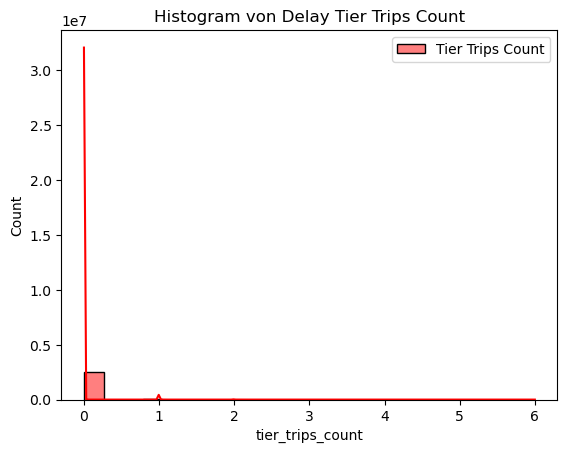

In [47]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(data['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
#sns.histplot(delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
# sns.histplot(delay['arrival_delay'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

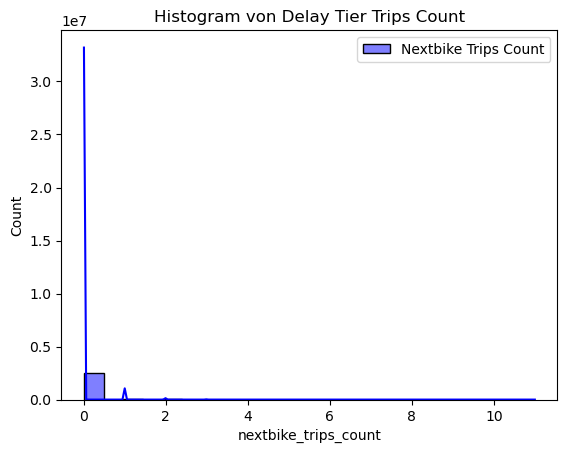

In [48]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(data['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

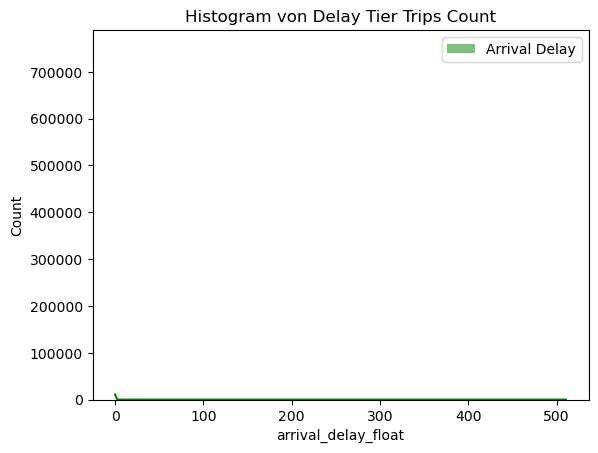

In [49]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(data['arrival_delay_float'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

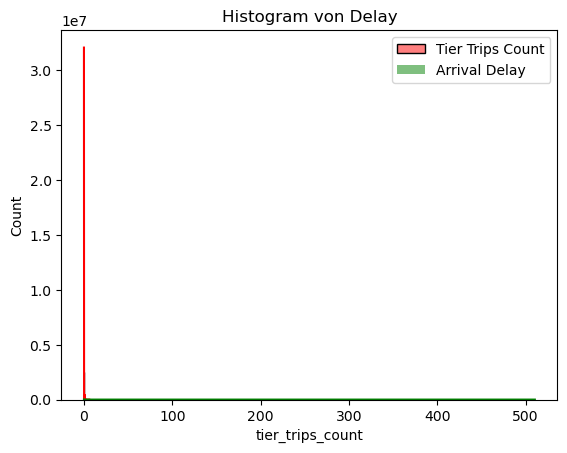

In [50]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(data['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
sns.histplot(data['arrival_delay_float'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay')
plt.show()

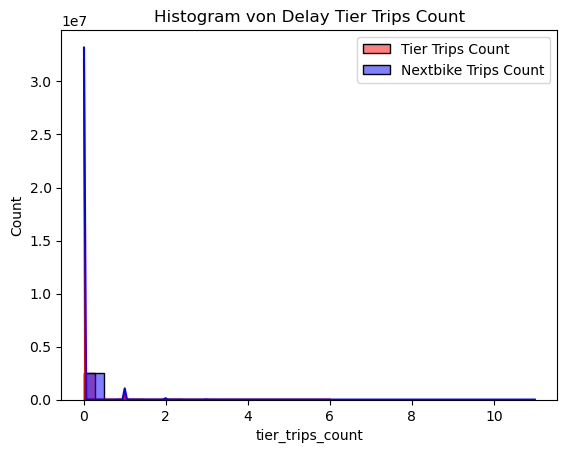

In [51]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(data['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
sns.histplot(data['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

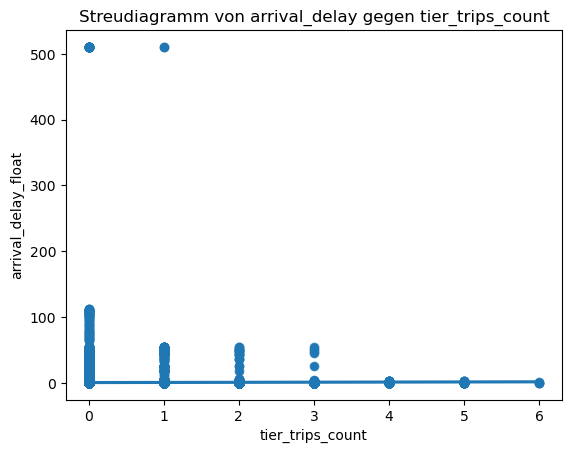

In [52]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(y='arrival_delay_float', x='tier_trips_count', data=data)
sns.regplot(y ='arrival_delay_float', x='tier_trips_count', data=data, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

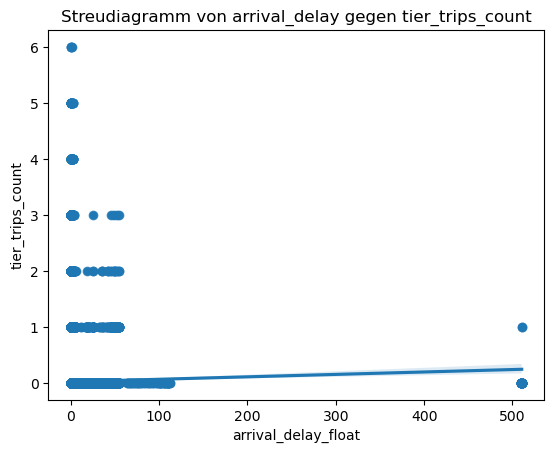

In [53]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay_float', y='tier_trips_count', data=data)
sns.regplot(x ='arrival_delay_float', y='tier_trips_count', data=data, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

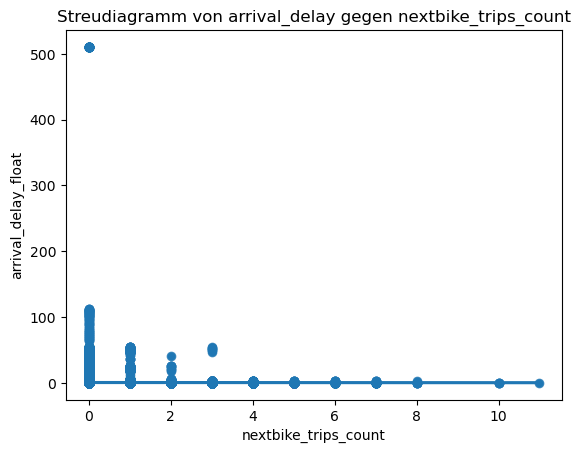

In [54]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(y='arrival_delay_float', x='nextbike_trips_count', data=data)
sns.regplot(y ='arrival_delay_float', x='nextbike_trips_count', data=data, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

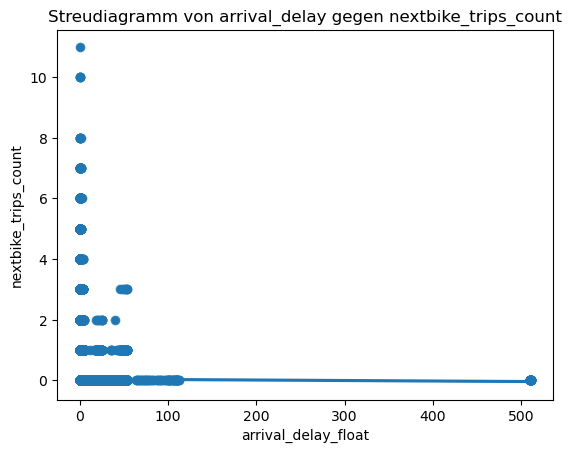

In [55]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay_float', y='nextbike_trips_count', data=data)
sns.regplot(x ='arrival_delay_float', y='nextbike_trips_count', data=data, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

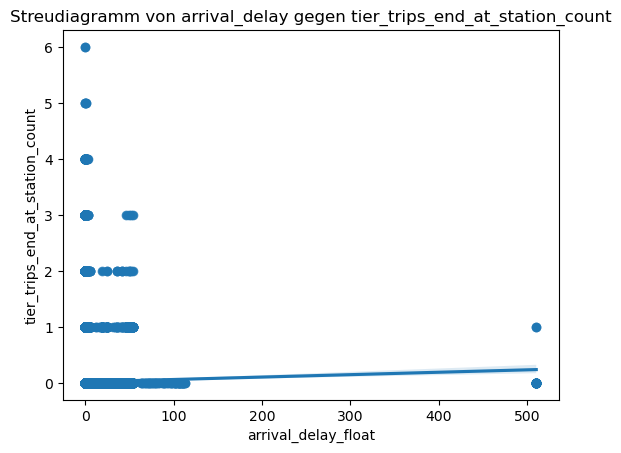

In [56]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay_float', y='tier_trips_end_at_station_count', data=data)
sns.regplot(x ='arrival_delay_float', y='tier_trips_end_at_station_count', data=data, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_end_at_station_count')
plt.show()

### Delay

In [57]:
delay = data[data['departure_delay'] > pd.Timedelta(0)]


In [58]:
delay

,route_id,agency_id,route_short_name,route_type,route_type_name,agency_name,service_id,trip_id,trip_headsign,direction_id,...,delay_span,arrival_delay_span,weather_int,time_span_arrival,time_span_int_arrival,weekend,time_span,time_span_int,delay_category,cancelled_trip
0,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
1,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
2,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
3,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
4,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2564839,689,6,N9,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,43,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,Bonn Hbf,0,...,0-5,0,1,early morning,8,0,early morning,8,1,0
2564841,689,6,N9,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,43,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,Bonn Hbf,0,...,0-5,0,1,early morning,8,0,early morning,8,1,0
2564843,688,6,N8,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,179,6880005-688-006-687.2.32:263500-36-1_5350170A-...,Bonn Hbf,0,...,0-5,0,1,early morning,8,0,early morning,8,1,0
2564847,688,6,N8,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,179,6880005-688-006-687.2.32:263500-36-1_5350170A-...,Bonn Hbf,0,...,0-5,0,1,early morning,8,0,early morning,8,0,0


In [59]:
delay.describe()

,route_id,agency_id,route_type,service_id,direction_id,shape_id,stop_id,actual_arrival_time,actual_departure_time,vrs_timestamp,...,departure_delay_float,actual_arrival_time_float,actual_departure_time_float,arrival_delay_span,weather_int,time_span_int_arrival,weekend,time_span_int,delay_category,cancelled_trip
count,950266.000000,950266.000000,950266.000000,950266.000000,950266.000000,950266.000000,950266.000000,922490,950266,950266.000000,...,950266.000000,950266.000000,950266.000000,950266.0,950266.000000,950266.000000,950266.00000,950266.000000,950266.000000,950266.0
mean,565.554253,6.005974,2.754132,2862.957891,0.509721,3612.220960,2322.804288,2023-07-16 18:00:59.627910912,2023-07-16 18:34:38.471684864,135822.659095,...,0.748887,135778.715804,139664.951135,0.0,0.168433,3.005692,0.71758,3.093952,0.636938,0.0
min,18.000000,1.000000,0.000000,3.000000,0.000000,6.000000,43.000000,2023-07-01 01:24:50,2023-07-01 01:25:10,804.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,-1.000000,0.0
25%,602.000000,6.000000,3.000000,64.000000,0.000000,1918.000000,1214.000000,2023-07-09 06:04:30,2023-07-09 06:05:30,90305.000000,...,0.250000,93200.000000,95530.000000,0.0,0.000000,1.000000,0.00000,1.000000,0.000000,0.0
50%,607.000000,6.000000,3.000000,64.000000,1.000000,2717.000000,1441.000000,2023-07-17 12:03:15,2023-07-17 12:36:15,134305.000000,...,0.500000,140600.000000,141930.000000,0.0,0.000000,3.000000,0.00000,3.000000,1.000000,0.0
75%,611.000000,6.000000,3.000000,130.000000,1.000000,5633.000000,1682.000000,2023-07-24 12:18:30,2023-07-24 13:02:45,182304.000000,...,0.750000,183215.000000,183830.000000,0.0,0.000000,5.000000,1.00000,5.000000,1.000000,0.0
max,843.000000,12.000000,3.000000,27690.000000,1.000000,10396.000000,9780.000000,2023-08-01 03:19:00,2023-08-01 03:19:15,235807.000000,...,510.750000,235945.000000,235950.000000,0.0,2.000000,8.000000,3.00000,8.000000,1.000000,0.0
std,153.090395,0.167664,0.822893,8178.754925,0.499906,2795.312776,2419.071095,NaN,NaN,55771.456861,...,3.739202,58455.953566,54280.290761,0.0,0.439083,2.087547,1.02544,2.050209,0.538245,0.0


In [60]:
delay.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 950266 entries, 0 to 2564851
Data columns (total 58 columns):
 #   Column                               Non-Null Count   Dtype          
---  ------                               --------------   -----          
 0   route_id                             950266 non-null  int64          
 1   agency_id                            950266 non-null  int64          
 2   route_short_name                     950266 non-null  object         
 3   route_type                           950266 non-null  int64          
 4   route_type_name                      950266 non-null  object         
 5   agency_name                          950266 non-null  object         
 6   service_id                           950266 non-null  int64          
 7   trip_id                              950266 non-null  object         
 8   trip_headsign                        950266 non-null  object         
 9   direction_id                         950266 non-null  i

In [61]:
get_stats(delay, ['arrival_delay_float', 'departure_delay_float', 'tier_trips_count', 'tier_trips_end_at_station_count', 'nextbike_trips_count', 'nextbike_trips_end_at_station_count', 'current_temp', 'current_precipitation_volume'])

/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile

column,arrival_delay_float,departure_delay_float,tier_trips_count,tier_trips_end_at_station_count,nextbike_trips_count,nextbike_trips_end_at_station_count,current_temp,current_precipitation_volume
number of rows,950266,950266,950266,950266,950266,950266,950266,950266
sum,420662.0,711641.583333,12472,10187,33484,28157,20210022.86,77381.69
mean,0.456007,0.748887,0.013125,0.01072,0.035236,0.029631,21.267753,0.607621
median,0.25,0.5,0.0,0.0,0.0,0.0,20.77,0.36
mode,"0 0.5 Name: arrival_delay_float, dtype: flo...","0 0.75 Name: departure_delay_float, dtype: ...","0 0 Name: tier_trips_count, dtype: int64","0 0 Name: tier_trips_end_at_station_count, ...","0 0 Name: nextbike_trips_count, dtype: int64",0 0 Name: nextbike_trips_end_at_station_cou...,"0 21.48 Name: current_temp, dtype: float64","0 0.49 Name: current_precipitation_volume, ..."
max,510.5,510.75,6,6,8,8,35.37,3.89
min,0.0,0.0,0,0,0,0,11.13,0.11
std_dev,3.722559,3.739202,0.124343,0.111622,0.212242,0.191924,4.516619,0.693509
variance,13.857447,13.981633,0.015461,0.012459,0.045047,0.036835,20.399845,0.480954
skewness,92.730011,91.561986,11.346815,12.263409,7.628142,7.969663,0.709853,3.012741


In [62]:
get_stats(delay, ['arrival_delay_float', 'departure_delay_float', 'tier_trips_count', 'tier_trips_end_at_station_count', 'nextbike_trips_count', 'nextbike_trips_end_at_station_count', 'current_temp', 'current_precipitation_volume'])

/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile

column,arrival_delay_float,departure_delay_float,tier_trips_count,tier_trips_end_at_station_count,nextbike_trips_count,nextbike_trips_end_at_station_count,current_temp,current_precipitation_volume
number of rows,950266,950266,950266,950266,950266,950266,950266,950266
sum,420662.0,711641.583333,12472,10187,33484,28157,20210022.86,77381.69
mean,0.456007,0.748887,0.013125,0.01072,0.035236,0.029631,21.267753,0.607621
median,0.25,0.5,0.0,0.0,0.0,0.0,20.77,0.36
mode,"0 0.5 Name: arrival_delay_float, dtype: flo...","0 0.75 Name: departure_delay_float, dtype: ...","0 0 Name: tier_trips_count, dtype: int64","0 0 Name: tier_trips_end_at_station_count, ...","0 0 Name: nextbike_trips_count, dtype: int64",0 0 Name: nextbike_trips_end_at_station_cou...,"0 21.48 Name: current_temp, dtype: float64","0 0.49 Name: current_precipitation_volume, ..."
max,510.5,510.75,6,6,8,8,35.37,3.89
min,0.0,0.0,0,0,0,0,11.13,0.11
std_dev,3.722559,3.739202,0.124343,0.111622,0.212242,0.191924,4.516619,0.693509
variance,13.857447,13.981633,0.015461,0.012459,0.045047,0.036835,20.399845,0.480954
skewness,92.730011,91.561986,11.346815,12.263409,7.628142,7.969663,0.709853,3.012741


In [63]:
show_short_df(delay)

,route_id,trip_id,stop_id,stop_name,scheduled_arrival_time,actual_arrival_time,scheduled_departure_time,actual_departure_time,arrival_delay,departure_delay,tier_trips_count,tier_trips_end_at_station_count,nextbike_trips_count,nextbike_trips_end_at_station_count,buffer_zone,arrival_delay_float,departure_delay_float
0,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,687,Bonn Hbf,2023-06-30 01:40:00,NaT,2023-06-30 01:40:00,2023-07-01 01:40:00,NaT,1 days 00:00:00,1,1,0,0,"POLYGON ((7.09988 50.73234, 7.09992 50.73217, ...",NaN,0.00
1,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1106,Bonn Thomas-Mann-Str.,2023-06-30 01:42:00,NaT,2023-06-30 01:42:00,2023-07-01 01:42:00,NaT,1 days 00:00:00,0,0,0,0,"POLYGON ((7.09762 50.73411, 7.09766 50.73393, ...",NaN,0.00
2,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1102,Bonn Friedensplatz,2023-06-30 01:44:00,NaT,2023-06-30 01:44:00,2023-07-01 01:44:00,NaT,1 days 00:00:00,0,0,0,0,"POLYGON ((7.10040 50.73662, 7.10044 50.73644, ...",NaN,0.00
3,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1115,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,2023-06-30 01:46:00,NaT,2023-06-30 01:46:00,2023-07-01 01:46:00,NaT,1 days 00:00:00,0,0,0,0,"POLYGON ((7.10523 50.73780, 7.10527 50.73763, ...",NaN,0.00
4,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1500,Bonn Konrad-Adenauer-Platz,2023-06-30 01:49:00,NaT,2023-06-30 01:49:00,2023-07-01 01:49:00,NaT,1 days 00:00:00,0,0,0,0,"POLYGON ((7.12019 50.73957, 7.12023 50.73939, ...",NaN,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2564839,689,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,1454,Bonn An Der Dransdorfer Burg,2023-08-01 03:14:00,2023-08-01 03:14:30,2023-08-01 03:14:00,2023-08-01 03:14:45,0 days 00:00:30,0 days 00:00:45,0,0,0,0,"POLYGON ((7.05457 50.73624, 7.05461 50.73607, ...",0.5,0.75
2564841,689,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,1453,Bonn Hans-Sachs-Str.,2023-08-01 03:15:00,2023-08-01 03:15:30,2023-08-01 03:15:00,2023-08-01 03:15:30,0 days 00:00:30,0 days 00:00:30,0,0,0,0,"POLYGON ((7.06163 50.73599, 7.06167 50.73581, ...",0.5,0.50
2564843,688,6880005-688-006-687.2.32:263500-36-1_5350170A-...,1112,Bonn Stiftsplatz,2023-08-01 03:16:00,2023-08-01 03:16:30,2023-08-01 03:16:00,2023-08-01 03:16:45,0 days 00:00:30,0 days 00:00:45,0,0,0,0,"POLYGON ((7.10435 50.73943, 7.10439 50.73926, ...",0.5,0.75
2564847,688,6880005-688-006-687.2.32:263500-36-1_5350170A-...,2667,Bonn Brüdergasse/Bertha-Von-Suttner-Platz,2023-08-01 03:18:00,2023-08-01 03:18:00,2023-08-01 03:18:00,2023-08-01 03:18:15,0 days 00:00:00,0 days 00:00:15,0,0,0,0,"POLYGON ((7.10697 50.73710, 7.10701 50.73693, ...",0.0,0.25


In [64]:
# check Tier data for delay
delay_tier = check_micromobility_datasets('tier', delay)

In [65]:
delay_tier.describe()

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,8.611000e+03,8611,8611,8611,8611.000000,8611.000000,6048.000000,4720.000000,8611.000000
mean,7.983235e+08,2023-07-15 10:18:24.366508288,2023-07-15 10:32:31.564278272,0 days 00:14:07.197770293,1.734128,1734.127757,1442.906085,1380.241102,847.197770
min,7.822645e+08,2023-06-30 01:45:00,2023-06-30 02:05:00,0 days 00:05:00,0.100174,100.173813,43.000000,43.000000,300.000000
25%,7.823768e+08,2023-07-07 19:52:30,2023-07-07 20:05:00,0 days 00:10:00,0.747713,747.713301,1103.000000,1102.000000,600.000000
50%,8.086263e+08,2023-07-13 19:30:00,2023-07-13 20:00:00,0 days 00:10:00,1.337000,1337.000032,1136.000000,1144.000000,600.000000
75%,8.087460e+08,2023-07-22 13:35:00,2023-07-22 13:47:30,0 days 00:15:00,2.308697,2308.697478,1255.000000,1241.000000,900.000000
max,8.323141e+08,2023-08-01 01:45:00,2023-08-01 02:05:00,0 days 01:55:00,13.908704,13908.703513,9780.000000,9780.000000,6900.000000
std,1.674117e+07,NaN,NaN,0 days 00:09:36.571536418,1.430703,1430.702728,1461.181087,1400.427191,576.571536


In [66]:
get_stats(delay_tier, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,8611,8611
sum,7295220.0,14932.574117
mean,847.19777,1.734128
median,600.0,1.337
mode,"0 600.0 Name: trip_duration_seconds, dtype:...",0 0.100174 1 0.100290 2 0...
max,6900.0,13.908704
min,300.0,0.100174
std_dev,576.571536,1.430703
variance,332434.736608,2.04691
skewness,3.850633,1.875194


In [67]:
# get entries where trips start and end at station
delay_tier_station_station = delay_tier[delay_tier['end_stop_id'].notna() & delay_tier['start_stop_id'].notna()]
delay_tier_station_station

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,vehicle type,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,start_stop_name,start_buffer_zone,end_stop_id,end_stop_name,end_buffer_zone,trip_duration_seconds,start_location,end_location
3171653,782356027,2023-06-30 01:45:00,2023-06-30 02:05:00,e-scooter,0 days 00:20:00,3.598056,3598.055590,687.0,Bonn Hbf,801621 POLYGON ((7.157885983913106 50.7227...,1406.0,Bonn Kopenhagener Str.,801621 ...,1200.0,POINT (7.09506 50.73298),POINT (7.07331 50.75712)
3209527,782391260,2023-07-01 01:45:00,2023-07-01 01:50:00,e-scooter,0 days 00:05:00,0.670973,670.973151,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,687.0,Bonn Hbf,801621 ...,300.0,POINT (7.10180 50.73728),POINT (7.09852 50.73217)
3210269,782391943,2023-07-01 01:45:00,2023-07-01 01:50:00,e-scooter,0 days 00:05:00,0.838693,838.692953,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,687.0,Bonn Hbf,801621 ...,300.0,POINT (7.10410 50.73699),POINT (7.09815 50.73232)
3234236,782413798,2023-07-01 06:40:00,2023-07-01 06:45:00,e-scooter,0 days 00:05:00,0.844529,844.529088,1131.0,Bonn Weberstr.,801621 POLYGON ((7.157885983913106 50.7227...,687.0,Bonn Hbf,801621 ...,300.0,POINT (7.10205 50.72540),POINT (7.09679 50.73093)
3164060,782350073,2023-07-01 07:10:00,2023-07-01 07:15:00,e-scooter,0 days 00:05:00,0.941159,941.158971,1182.0,Bonn Chlodwigplatz,801621 POLYGON ((7.157885983913106 50.7227...,688.0,Bonn West,801621 ...,300.0,POINT (7.08933 50.74278),POINT (7.08230 50.73803)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3422531,832205256,2023-07-31 23:25:00,2023-08-01 00:00:00,e-scooter,0 days 00:35:00,1.787106,1787.106290,1153.0,Bonn Heerstr.,801621 POLYGON ((7.157885983913106 50.7227...,1190.0,Bonn Zeisigweg,801621 ...,2100.0,POINT (7.09015 50.73736),POINT (7.07489 50.74243)
3485603,832265823,2023-07-31 23:25:00,2023-08-01 00:00:00,e-scooter,0 days 00:35:00,1.774445,1774.445116,1153.0,Bonn Heerstr.,801621 POLYGON ((7.157885983913106 50.7227...,1190.0,Bonn Zeisigweg,801621 ...,2100.0,POINT (7.09011 50.73738),POINT (7.07496 50.74244)
3398184,832181971,2023-08-01 00:10:00,2023-08-01 00:20:00,e-scooter,0 days 00:10:00,0.649892,649.892254,1255.0,Bonn Graf-Stauffenberg-Str.,801621 POLYGON ((7.157885983913106 50.7227...,6994.0,Bonn Heinrich-Lützeler-Str.,801621 ...,600.0,POINT (7.10419 50.71648),POINT (7.09839 50.71719)
3326567,832125594,2023-08-01 01:45:00,2023-08-01 02:05:00,e-scooter,0 days 00:20:00,0.308480,308.479763,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,1111.0,Bonn Beethovenhalle Und Swb,801621 ...,1200.0,POINT (7.10401 50.73732),POINT (7.10429 50.74010)


In [68]:
delay_tier_station_station.describe()

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,3.896000e+03,3896,3896,3896,3896.000000,3896.000000,3896.000000,3896.00000,3896.000000
mean,7.978198e+08,2023-07-15 06:35:34.111909632,2023-07-15 06:48:28.228952576,0 days 00:12:54.117043121,1.423031,1423.030582,1446.765144,1416.25770,774.117043
min,7.822648e+08,2023-06-30 01:45:00,2023-06-30 02:05:00,0 days 00:05:00,0.100174,100.173813,43.000000,43.00000,300.000000
25%,7.823733e+08,2023-07-07 19:58:45,2023-07-07 20:10:00,0 days 00:10:00,0.626023,626.022761,1103.000000,1103.00000,600.000000
50%,7.824646e+08,2023-07-13 14:27:30,2023-07-13 14:35:00,0 days 00:10:00,1.102653,1102.653303,1140.000000,1150.00000,600.000000
75%,8.087422e+08,2023-07-22 07:21:15,2023-07-22 07:30:00,0 days 00:15:00,1.934300,1934.300411,1240.000000,1243.00000,900.000000
max,8.323115e+08,2023-08-01 01:45:00,2023-08-01 02:05:00,0 days 01:45:00,9.093761,9093.761020,9780.000000,9780.00000,6300.000000
std,1.680557e+07,NaN,NaN,0 days 00:08:25.424125112,1.126577,1126.577326,1455.861211,1429.85439,505.424125


In [69]:
# get statistics for the tier trips that start and end at a station
get_stats(delay_tier_station_station, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,3896,3896
sum,3015960.0,5544.127147
mean,774.117043,1.423031
median,600.0,1.102653
mode,"0 600.0 Name: trip_duration_seconds, dtype:...",0 0.100174 1 0.100290 2 0.10...
max,6300.0,9.093761
min,300.0,0.100174
std_dev,505.424125,1.126577
variance,255453.546246,1.269176
skewness,4.015907,1.61936


In [70]:
delay_next = check_micromobility_datasets('next', delay)

In [71]:
delay_next.describe()

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,2.221200e+04,22212,22212,22212,22212.000000,22212.000000,16240.000000,12875.000000,22212.000000
mean,3.793969e+07,2023-07-15 16:51:50.780658944,2023-07-15 17:06:41.680172800,0 days 00:14:50.899513776,1.732635,1732.635207,1307.213239,1293.153786,890.899514
min,3.771653e+07,2023-07-01 05:16:00,2023-07-01 05:46:00,0 days 00:05:00,0.100057,100.057033,43.000000,43.000000,300.000000
25%,3.782821e+07,2023-07-08 10:01:00,2023-07-08 10:16:00,0 days 00:10:00,0.768501,768.500796,1102.000000,697.000000,600.000000
50%,3.794191e+07,2023-07-14 15:41:00,2023-07-14 15:56:00,0 days 00:15:00,1.346888,1346.887697,1143.000000,1144.000000,900.000000
75%,3.804865e+07,2023-07-22 11:11:00,2023-07-22 11:31:00,0 days 00:15:00,2.254992,2254.991567,1224.000000,1221.000000,900.000000
max,3.817174e+07,2023-08-01 00:41:00,2023-08-01 00:46:00,0 days 02:00:00,14.143293,14143.293036,9780.000000,9780.000000,7200.000000
std,1.281510e+05,NaN,NaN,0 days 00:09:50.765916800,1.439398,1439.398121,1234.868278,1293.213850,590.765917


In [72]:
get_stats(delay_next, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,22212,22212
sum,19788660.0,38485.293226
mean,890.899514,1.732635
median,900.0,1.346888
mode,"0 600.0 Name: trip_duration_seconds, dtype:...","0 0.870199 Name: trip_distance_kilometers, ..."
max,7200.0,14.143293
min,300.0,0.100057
std_dev,590.765917,1.439398
variance,349004.368453,2.071867
skewness,3.946175,2.189434


In [73]:
# get entries where trips start and end at station
delay_next_station_station = delay_next[delay_next['end_stop_id'].notna() & delay_next['start_stop_id'].notna()]
delay_next_station_station

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,nextbike_trips_start_at_station,nextbike_trips_end_at_station,vehicle type,trip_duration,trip_distance_kilometers,trip_distance_meters,start_location,end_location,start_stop_id,start_stop_name,start_buffer_zone,end_stop_id,end_stop_name,end_buffer_zone,trip_duration_seconds
1417189,37961351,2023-07-01 05:41:00,2023-07-01 05:56:00,False,False,bike,0 days 00:15:00,1.671334,1671.334291,"b'\x01\x01\x00\x00\x00\xd9\n\x9a\x96XY\x1c@""\x...",b'\x01\x01\x00\x00\x00\x82\x8d\xeb\xdf\xf5I\x1...,1151.0,Bonn Frankenbad/Kunstverein,215356 ...,43.0,Bonn Propsthof Nord,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1220393,37717932,2023-07-01 05:56:00,2023-07-01 06:11:00,False,False,bike,0 days 00:15:00,1.377444,1377.444442,b'\x01\x01\x00\x00\x00\xcfj\x81=&R\x1c@\x7f\xa...,b'\x01\x01\x00\x00\x00\x9f\xe4\x0e\x9b\xc8L\x1...,8437.0,Bonn An Der Josefshöhe,215356 ...,1190.0,Bonn Zeisigweg,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1235649,37726317,2023-07-01 06:06:00,2023-07-01 06:21:00,False,False,bike,0 days 00:15:00,2.055591,2055.591133,"b""\x01\x01\x00\x00\x00\xf0\xf8\xf6\xaeA_\x1c@\...",b'\x01\x01\x00\x00\x00B\xd1<\x80En\x1c@\x84*5{...,1182.0,Bonn Chlodwigplatz,215356 ...,685.0,Bonn Juridicum,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1267255,37827523,2023-07-01 06:06:00,2023-07-01 06:16:00,False,False,bike,0 days 00:10:00,1.000358,1000.357907,b'\x01\x01\x00\x00\x00\xc0\x06D\x88+g\x1c@\xef...,b'\x01\x01\x00\x00\x00\x8f\x89\x94f\xf3h\x1c@f...,1160.0,Bonn Nordstr.,215356 ...,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,215356 POLYGON ((7.120193524138334 50.7395...,600.0
1638081,37769500,2023-07-01 06:11:00,2023-07-01 06:21:00,False,True,bike,0 days 00:10:00,0.914302,914.302426,b'\x01\x01\x00\x00\x00\xc5V\xd0\xb4\xc4Z\x1c@\...,b'\x01\x01\x00\x00\x00\x06.\x8f5#c\x1c@\x9dJ\x...,1153.0,Bonn Heerstr.,215356 ...,1102.0,Bonn Friedensplatz,215356 POLYGON ((7.120193524138334 50.7395...,600.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1333820,37861619,2023-07-31 22:16:00,2023-07-31 22:26:00,False,False,bike,0 days 00:10:00,0.864220,864.220203,b'\x01\x01\x00\x00\x00h\x06\xf1\x81\x1d_\x1c@\...,b'\x01\x01\x00\x00\x00\x1fh\x05\x86\xac^\x1c@\...,1104.0,Bonn Stadthaus,215356 ...,1175.0,Bonn Lvr-Klinik,215356 POLYGON ((7.120193524138334 50.7395...,600.0
1476595,38040111,2023-07-31 22:26:00,2023-07-31 22:41:00,False,True,bike,0 days 00:15:00,1.658928,1658.927837,b'\x01\x01\x00\x00\x00\xb1\xa3q\xa8\xdfe\x1c@r...,b'\x01\x01\x00\x00\x00\x1c`\xe6;\xf8Y\x1c@.\xe...,1143.0,Bonn Poppelsdorfer Allee,215356 ...,1240.0,Bonn Poppelsdorfer Platz,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1443891,38014658,2023-07-31 22:51:00,2023-07-31 23:06:00,True,False,bike,0 days 00:15:00,2.202721,2202.720792,b'\x01\x01\x00\x00\x00\x06.\x8f5#c\x1c@\x9dJ\x...,b'\x01\x01\x00\x00\x00\x0fc\xd2\xdfKQ\x1c@~\x1...,1102.0,Bonn Friedensplatz,215356 ...,1620.0,Bonn Max-Bruch-Str.,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1441769,38012536,2023-07-31 23:21:00,2023-07-31 23:41:00,False,False,bike,0 days 00:20:00,3.058475,3058.475311,b'\x01\x01\x00\x00\x00}\xca1Y\xdc\x7f\x1c@ILP\...,b'\x01\x01\x00\x00\x00\x8b\xc0X\xdf\xc0d\x1c@&...,1502.0,Bonn Beueler Bahnhofsplatz,215356 ...,687.0,Bonn Hbf,215356 POLYGON ((7.120193524138334 50.7395...,1200.0


In [74]:
delay_next_station_station.describe()

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,1.041400e+04,10414,10414,10414,10414.000000,10414.000000,10414.000000,10414.000000,10414.000000
mean,3.794147e+07,2023-07-15 12:58:35.951603456,2023-07-15 13:12:09.120414976,0 days 00:13:33.168811215,1.431897,1431.897347,1334.124064,1327.774342,813.168811
min,3.771653e+07,2023-07-01 05:41:00,2023-07-01 05:56:00,0 days 00:05:00,0.100057,100.057033,43.000000,43.000000,300.000000
25%,3.782975e+07,2023-07-08 09:36:00,2023-07-08 09:46:00,0 days 00:10:00,0.711259,711.259033,1102.000000,1102.000000,600.000000
50%,3.794299e+07,2023-07-14 11:38:30,2023-07-14 11:48:30,0 days 00:10:00,1.178690,1178.689723,1143.000000,1145.000000,600.000000
75%,3.804971e+07,2023-07-21 22:14:45,2023-07-21 22:24:45,0 days 00:15:00,1.873923,1873.922865,1223.000000,1221.000000,900.000000
max,3.817174e+07,2023-07-31 23:31:00,2023-07-31 23:56:00,0 days 02:00:00,9.640671,9640.671235,9780.000000,9780.000000,7200.000000
std,1.278787e+05,NaN,NaN,0 days 00:08:22.180019361,1.076630,1076.630211,1271.691868,1342.109738,502.180019


In [75]:
get_stats(delay_next_station_station, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,10414,10414
sum,8468340.0,14911.778977
mean,813.168811,1.431897
median,600.0,1.17869
mode,"0 600.0 Name: trip_duration_seconds, dtype:...","0 0.834842 Name: trip_distance_kilometers, ..."
max,7200.0,9.640671
min,300.0,0.100057
std_dev,502.180019,1.07663
variance,252184.771846,1.159133
skewness,4.284547,1.832994


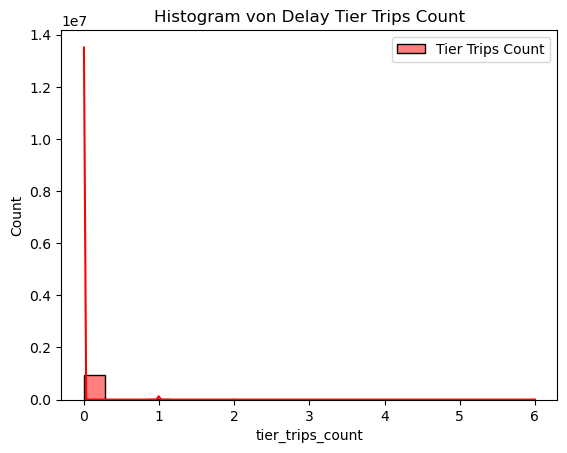

In [76]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
#sns.histplot(delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
# sns.histplot(delay['arrival_delay'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

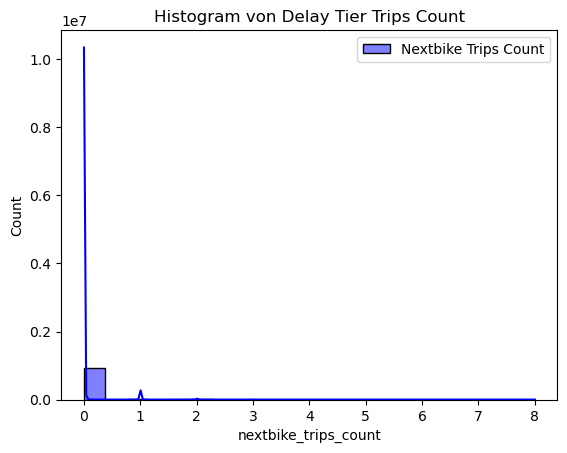

In [77]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

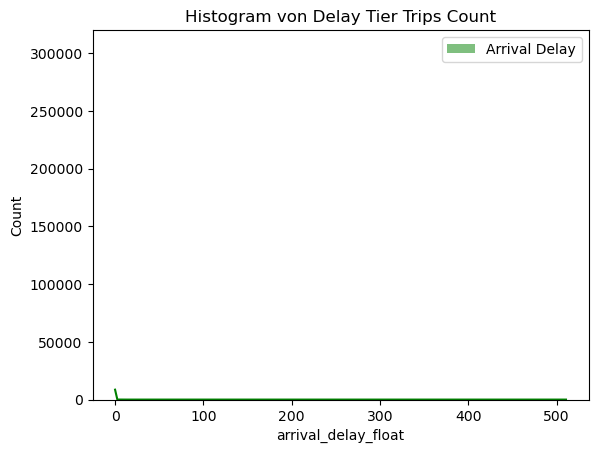

In [78]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(delay['arrival_delay_float'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

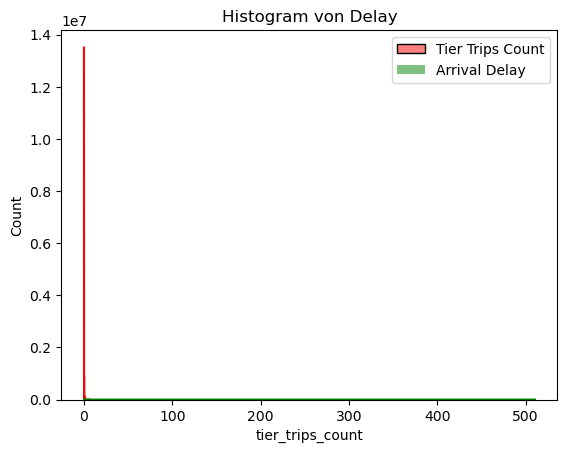

In [79]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
sns.histplot(delay['arrival_delay_float'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay')
plt.show()

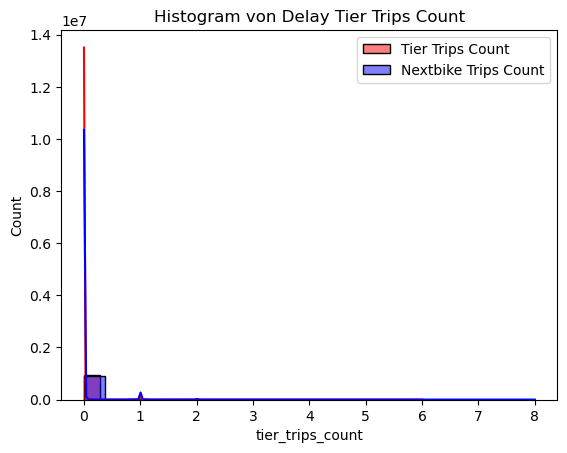

In [80]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
sns.histplot(delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

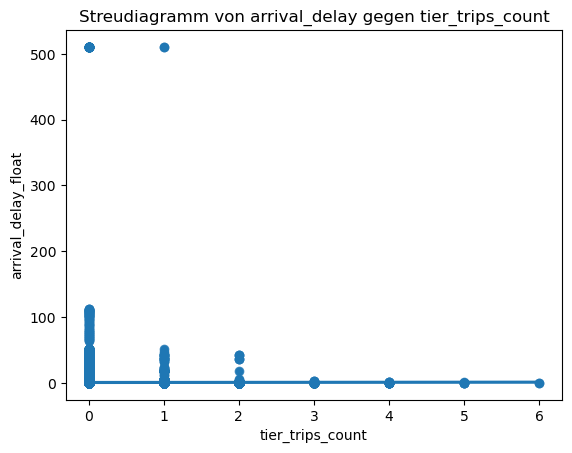

In [81]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(y='arrival_delay_float', x='tier_trips_count', data=delay)
sns.regplot(y ='arrival_delay_float', x='tier_trips_count', data=delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

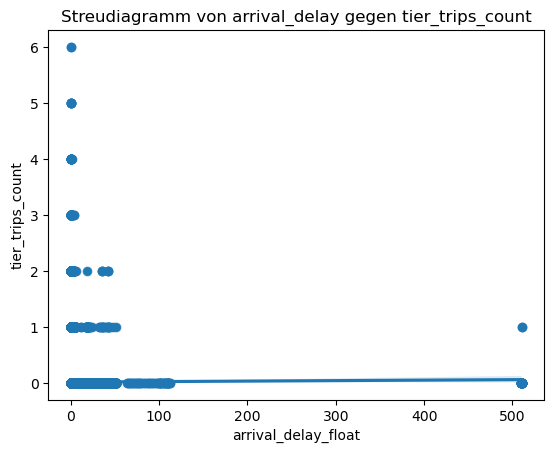

In [82]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay_float', y='tier_trips_count', data=delay)
sns.regplot(x ='arrival_delay_float', y='tier_trips_count', data=delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

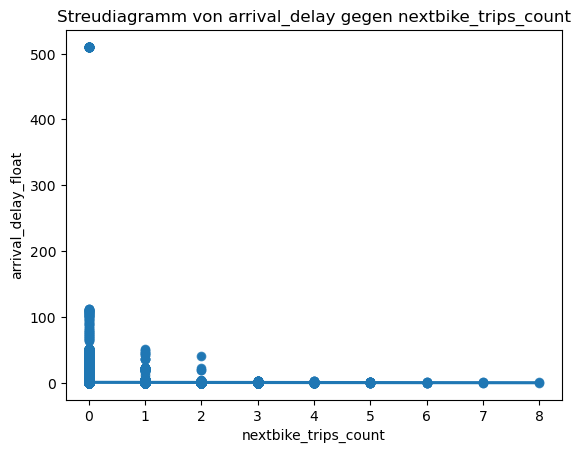

In [83]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(y='arrival_delay_float', x='nextbike_trips_count', data=delay)
sns.regplot(y ='arrival_delay_float', x='nextbike_trips_count', data=delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

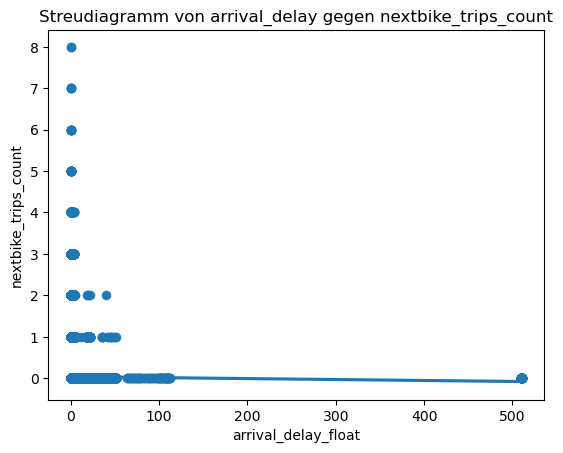

In [84]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay_float', y='nextbike_trips_count', data=delay)
sns.regplot(x ='arrival_delay_float', y='nextbike_trips_count', data=delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

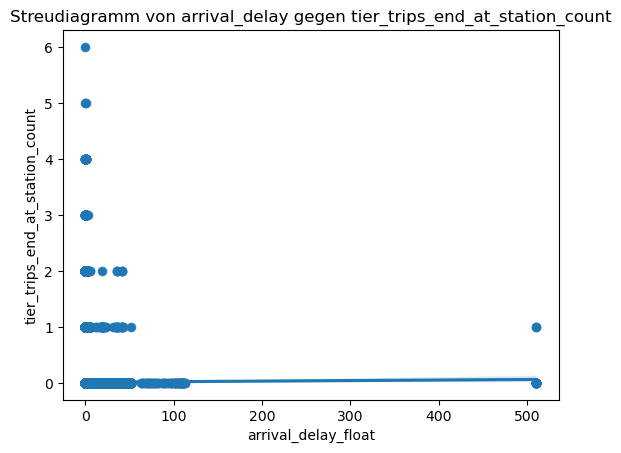

In [85]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay_float', y='tier_trips_end_at_station_count', data=delay)
sns.regplot(x ='arrival_delay_float', y='tier_trips_end_at_station_count', data=delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_end_at_station_count')
plt.show()

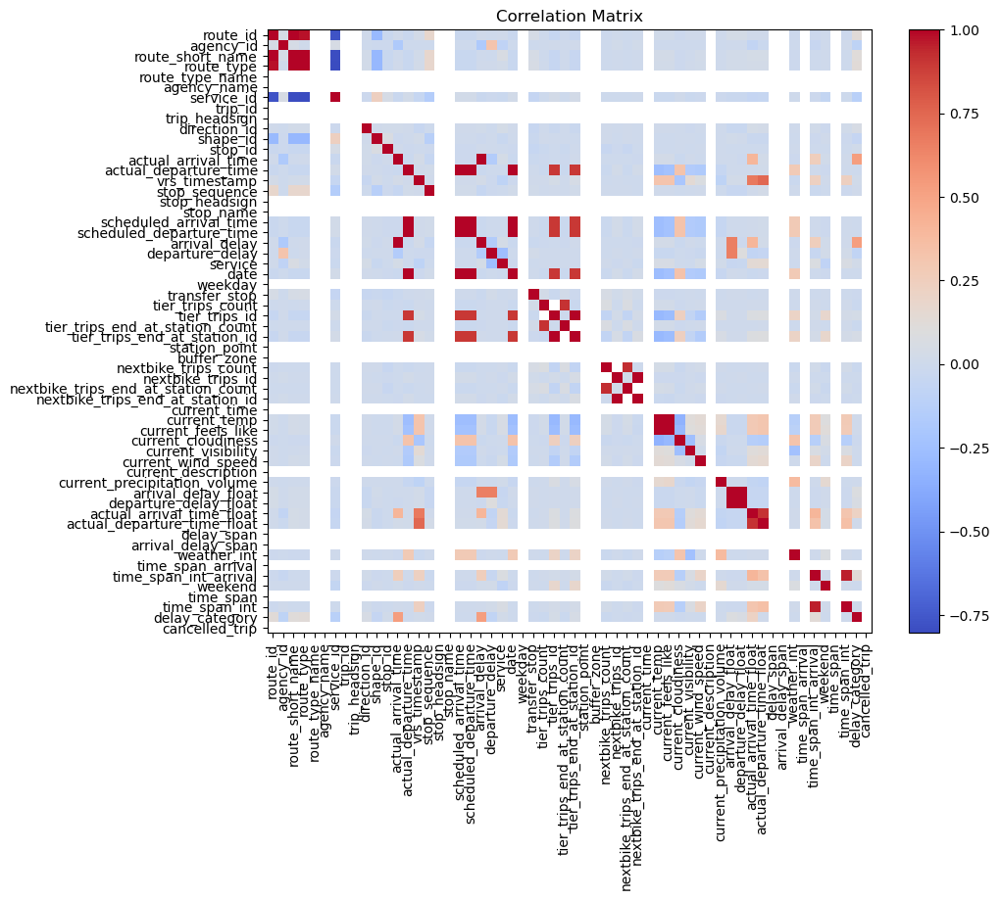

In [86]:
# Convert non-numeric columns to numeric data type
data1 = delay.apply(pd.to_numeric, errors='coerce')

# Calculate correlation matrix
correlation_matrix = data1.corr()
#print(correlation_matrix)

# Create correlation matrix
correlation_matrix = correlation_matrix

# Plot correlation matrix as heatmap
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title('Correlation Matrix')

# Save the plot in high resolution
plt.savefig('correlation_matrix.png', dpi=300)

### No Delay

In [87]:
#no_delay = data[data['arrival_delay'] == pd.Timedelta(0)]

# Assuming 'arrival_delay' is a Timedelta column
no_delay = data[
    (data['departure_delay'] == pd.Timedelta(0)) | 
    (data['scheduled_arrival_time'].notna() & 
     data['actual_arrival_time'].isna() & 
     data['scheduled_departure_time'].notna() & 
     data['actual_departure_time'].notna())
]

In [88]:
no_delay

,route_id,agency_id,route_short_name,route_type,route_type_name,agency_name,service_id,trip_id,trip_headsign,direction_id,...,delay_span,arrival_delay_span,weather_int,time_span_arrival,time_span_int_arrival,weekend,time_span,time_span_int,delay_category,cancelled_trip
0,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
1,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
2,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
3,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
4,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,93-551-008-687.2.36:014000-33-157_49E69401-92E...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2564809,688,6,N8,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,179,6880005-688-006-687.2.32:263500-36-1_5350170A-...,Bonn Hbf,0,...,0,0,1,early morning,8,0,early morning,8,0,0
2564811,687,6,N7,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,179,6870005-687-006-687.2.24:263500-34-1_F0CE2D00-...,Bad Godesberg Bf / Rheinallee,0,...,0,0,1,early morning,8,0,early morning,8,0,0
2564817,684,6,N4,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,179,6840005-684-006-687.2.32:263500-36-1_7F56FE12-...,Am Waldrand,0,...,0,0,1,early morning,8,0,early morning,8,0,0
2564834,689,6,N9,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,43,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,Bonn Hbf,0,...,0,0,1,early morning,8,0,early morning,8,0,0


In [89]:
no_delay.describe()

,route_id,agency_id,route_type,service_id,direction_id,shape_id,stop_id,actual_arrival_time,actual_departure_time,vrs_timestamp,...,departure_delay_float,actual_arrival_time_float,actual_departure_time_float,arrival_delay_span,weather_int,time_span_int_arrival,weekend,time_span_int,delay_category,cancelled_trip
count,600178.000000,600178.000000,600178.000000,600178.000000,600178.00000,600178.000000,600178.000000,431687,600178,600178.000000,...,600178.000000,600178.000000,600178.000000,600178.0,600178.000000,600178.000000,600178.000000,600178.000000,600178.000000,600178.0
mean,559.848093,6.990076,2.603513,5561.686826,0.49288,4227.779072,2177.153543,2023-07-16 16:06:31.895155456,2023-07-16 17:04:35.483721216,134755.611832,...,0.043198,100555.048209,139269.690573,0.0,0.171084,2.234679,0.727443,3.083787,-0.274272,0.0
min,16.000000,1.000000,0.000000,3.000000,0.00000,6.000000,43.000000,2023-07-01 00:33:00,2023-07-01 00:32:00,308.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,-1.000000,0.0
25%,551.000000,6.000000,3.000000,64.000000,0.00000,2014.000000,1177.000000,2023-07-08 20:57:40,2023-07-08 22:02:00,85803.000000,...,0.000000,0.000000,94800.000000,0.0,0.000000,0.000000,0.000000,1.000000,-1.000000,0.0
50%,607.000000,6.000000,3.000000,64.000000,0.00000,3858.000000,1414.000000,2023-07-17 11:13:45,2023-07-17 11:31:00,133305.000000,...,0.000000,105300.000000,141330.000000,0.0,0.000000,2.000000,0.000000,3.000000,0.000000,0.0
75%,614.000000,6.000000,3.000000,151.000000,1.00000,6377.000000,1702.000000,2023-07-24 11:11:35,2023-07-24 12:16:00,182304.000000,...,0.000000,170145.000000,184100.000000,0.0,0.000000,4.000000,2.000000,5.000000,0.000000,0.0
max,884.000000,12.000000,3.000000,29145.000000,1.00000,10396.000000,9780.000000,2023-08-01 03:15:45,2023-08-01 03:16:00,235807.000000,...,510.000000,235945.000000,235950.000000,0.0,2.000000,8.000000,3.000000,8.000000,1.000000,0.0
std,217.502117,2.117093,1.016003,10902.606345,0.49995,2862.483577,2303.986491,NaN,NaN,56077.608138,...,0.854009,78289.363412,54781.561853,0.0,0.442243,2.257568,1.025377,2.071034,0.460406,0.0


In [90]:
no_delay.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 600178 entries, 0 to 2564845
Data columns (total 58 columns):
 #   Column                               Non-Null Count   Dtype          
---  ------                               --------------   -----          
 0   route_id                             600178 non-null  int64          
 1   agency_id                            600178 non-null  int64          
 2   route_short_name                     600178 non-null  object         
 3   route_type                           600178 non-null  int64          
 4   route_type_name                      600178 non-null  object         
 5   agency_name                          600178 non-null  object         
 6   service_id                           600178 non-null  int64          
 7   trip_id                              600178 non-null  object         
 8   trip_headsign                        600178 non-null  object         
 9   direction_id                         600178 non-null  i

In [91]:
get_stats(no_delay, ['tier_trips_count', 'tier_trips_end_at_station_count', 'nextbike_trips_count', 'nextbike_trips_end_at_station_count', 'current_temp', 'current_precipitation_volume'])

/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile

column,tier_trips_count,tier_trips_end_at_station_count,nextbike_trips_count,nextbike_trips_end_at_station_count,current_temp,current_precipitation_volume
number of rows,600178,600178,600178,600178,600178,600178
sum,18180,14652,41205,34431,12696668.05,49080.78
mean,0.030291,0.024413,0.068655,0.057368,21.154837,0.601112
median,0.0,0.0,0.0,0.0,20.65,0.36
mode,"0 0 Name: tier_trips_count, dtype: int64","0 0 Name: tier_trips_end_at_station_count, ...","0 0 Name: nextbike_trips_count, dtype: int64",0 0 Name: nextbike_trips_end_at_station_cou...,"0 19.72 Name: current_temp, dtype: float64","0 0.49 Name: current_precipitation_volume, ..."
max,6,6,10,9,35.37,3.89
min,0,0,0,0,11.13,0.11
std_dev,0.199216,0.175674,0.335813,0.299416,4.501233,0.678092
variance,0.039687,0.030861,0.11277,0.08965,20.261099,0.459808
skewness,8.424294,8.92557,7.290724,7.456592,0.719582,3.051105


In [92]:
show_short_df(no_delay)

,route_id,trip_id,stop_id,stop_name,scheduled_arrival_time,actual_arrival_time,scheduled_departure_time,actual_departure_time,arrival_delay,departure_delay,tier_trips_count,tier_trips_end_at_station_count,nextbike_trips_count,nextbike_trips_end_at_station_count,buffer_zone,arrival_delay_float,departure_delay_float
0,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,687,Bonn Hbf,2023-06-30 01:40:00,NaT,2023-06-30 01:40:00,2023-07-01 01:40:00,NaT,1 days,1,1,0,0,"POLYGON ((7.09988 50.73234, 7.09992 50.73217, ...",NaN,0.0
1,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1106,Bonn Thomas-Mann-Str.,2023-06-30 01:42:00,NaT,2023-06-30 01:42:00,2023-07-01 01:42:00,NaT,1 days,0,0,0,0,"POLYGON ((7.09762 50.73411, 7.09766 50.73393, ...",NaN,0.0
2,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1102,Bonn Friedensplatz,2023-06-30 01:44:00,NaT,2023-06-30 01:44:00,2023-07-01 01:44:00,NaT,1 days,0,0,0,0,"POLYGON ((7.10040 50.73662, 7.10044 50.73644, ...",NaN,0.0
3,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1115,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,2023-06-30 01:46:00,NaT,2023-06-30 01:46:00,2023-07-01 01:46:00,NaT,1 days,0,0,0,0,"POLYGON ((7.10523 50.73780, 7.10527 50.73763, ...",NaN,0.0
4,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1500,Bonn Konrad-Adenauer-Platz,2023-06-30 01:49:00,NaT,2023-06-30 01:49:00,2023-07-01 01:49:00,NaT,1 days,0,0,0,0,"POLYGON ((7.12019 50.73957, 7.12023 50.73939, ...",NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2564809,688,6880005-688-006-687.2.32:263500-36-1_5350170A-...,1580,Bonn Broichstr.,2023-08-01 03:08:00,2023-08-01 03:07:45,2023-08-01 03:08:00,2023-08-01 03:08:00,0 days,0 days,0,0,0,0,"POLYGON ((7.14525 50.73530, 7.14529 50.73513, ...",0.0,0.0
2564811,687,6870005-687-006-687.2.24:263500-34-1_F0CE2D00-...,1760,Bonn Deichmanns Aue,2023-08-01 03:09:00,2023-08-01 03:08:45,2023-08-01 03:09:00,2023-08-01 03:09:00,0 days,0 days,0,0,0,0,"POLYGON ((7.18257 50.67137, 7.18260 50.67120, ...",0.0,0.0
2564817,684,6840005-684-006-687.2.32:263500-36-1_7F56FE12-...,1557,Bonn Niederholtorf Kirche,2023-08-01 03:09:00,2023-08-01 03:08:45,2023-08-01 03:09:00,2023-08-01 03:09:00,0 days,0 days,0,0,0,0,"POLYGON ((7.18825 50.73116, 7.18829 50.73099, ...",0.0,0.0
2564834,689,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,1458,Bonn Grootestr.,2023-08-01 03:13:00,2023-08-01 03:12:45,2023-08-01 03:13:00,2023-08-01 03:13:00,0 days,0 days,0,0,0,0,"POLYGON ((7.05016 50.73927, 7.05020 50.73910, ...",0.0,0.0


In [93]:
# check Tier data for delay
no_delay_tier = check_micromobility_datasets('tier', no_delay)

In [94]:
no_delay_tier.describe()

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,7.212000e+03,7212,7212,7212,7212.000000,7212.000000,5637.000000,3634.000000,7212.000000
mean,7.983333e+08,2023-07-15 10:53:45.349417472,2023-07-15 11:07:57.212978432,0 days 00:14:11.863560732,1.770099,1770.098546,1167.060493,1404.812053,851.863561
min,7.822646e+08,2023-06-30 01:45:00,2023-06-30 02:05:00,0 days 00:05:00,0.100067,100.066815,43.000000,43.000000,300.000000
25%,7.823747e+08,2023-07-07 22:03:45,2023-07-07 22:15:00,0 days 00:10:00,0.754034,754.034067,687.000000,1103.000000,600.000000
50%,8.086292e+08,2023-07-13 22:45:00,2023-07-13 22:55:00,0 days 00:10:00,1.360769,1360.769376,1110.000000,1150.000000,600.000000
75%,8.087460e+08,2023-07-22 15:25:00,2023-07-22 15:40:00,0 days 00:15:00,2.319081,2319.081467,1292.000000,1244.000000,900.000000
max,8.323115e+08,2023-08-01 00:10:00,2023-08-01 00:20:00,0 days 02:00:00,12.402037,12402.036677,9703.000000,9780.000000,7200.000000
std,1.662206e+07,NaN,NaN,0 days 00:09:52.892043645,1.479372,1479.372395,1058.502833,1409.779158,592.892044


In [95]:
# get entries where trips start and end at station
no_delay_tier_station_station = no_delay_tier[no_delay_tier['end_stop_id'].notna() & no_delay_tier['start_stop_id'].notna()]
no_delay_tier_station_station

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,vehicle type,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,start_stop_name,start_buffer_zone,end_stop_id,end_stop_name,end_buffer_zone,trip_duration_seconds,start_location,end_location
3171653,782356027,2023-06-30 01:45:00,2023-06-30 02:05:00,e-scooter,0 days 00:20:00,3.598056,3598.055590,687.0,Bonn Hbf,801621 POLYGON ((7.157885983913106 50.7227...,1406.0,Bonn Kopenhagener Str.,801621 ...,1200.0,POINT (7.09506 50.73298),POINT (7.07331 50.75712)
3209527,782391260,2023-07-01 01:45:00,2023-07-01 01:50:00,e-scooter,0 days 00:05:00,0.670973,670.973151,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,687.0,Bonn Hbf,801621 ...,300.0,POINT (7.10180 50.73728),POINT (7.09852 50.73217)
3210269,782391943,2023-07-01 01:45:00,2023-07-01 01:50:00,e-scooter,0 days 00:05:00,0.838693,838.692953,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,687.0,Bonn Hbf,801621 ...,300.0,POINT (7.10410 50.73699),POINT (7.09815 50.73232)
3254146,782431910,2023-07-01 01:50:00,2023-07-01 02:00:00,e-scooter,0 days 00:10:00,1.779253,1779.253071,687.0,Bonn Hbf,801621 POLYGON ((7.157885983913106 50.7227...,688.0,Bonn West,801621 ...,600.0,POINT (7.09818 50.73206),POINT (7.08279 50.73648)
2973348,782286043,2023-07-01 04:35:00,2023-07-01 04:50:00,e-scooter,0 days 00:15:00,3.658388,3658.388003,687.0,Bonn Hbf,801621 POLYGON ((7.157885983913106 50.7227...,1433.0,Bonn Paulusplatz,801621 ...,900.0,POINT (7.09660 50.73269),POINT (7.06609 50.74510)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3485596,832265817,2023-07-31 22:25:00,2023-07-31 22:45:00,e-scooter,0 days 00:20:00,1.171579,1171.578745,686.0,Bonn Universität/Markt,801621 POLYGON ((7.157885983913106 50.7227...,1153.0,Bonn Heerstr.,801621 ...,1200.0,POINT (7.10025 50.73326),POINT (7.09058 50.73749)
3518645,832297525,2023-07-31 22:55:00,2023-07-31 23:00:00,e-scooter,0 days 00:05:00,0.704362,704.361980,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,1161.0,Bonn An Der Esche,801621 ...,300.0,POINT (7.10309 50.73744),POINT (7.10055 50.74329)
3318827,832120317,2023-07-31 23:10:00,2023-08-01 00:20:00,e-scooter,0 days 01:10:00,0.117849,117.848655,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 ...,4200.0,POINT (7.10346 50.73716),POINT (7.10245 50.73747)
3421744,832204504,2023-07-31 23:15:00,2023-07-31 23:25:00,e-scooter,0 days 00:10:00,1.002491,1002.491082,1504.0,Bonn Beuel Bf,801621 POLYGON ((7.157885983913106 50.7227...,1126.0,Bonn Gerhardstr.,801621 ...,600.0,POINT (7.12768 50.73829),POINT (7.13061 50.74688)


In [96]:
no_delay_tier_station_station.describe()

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,3.228000e+03,3228,3228,3228,3228.000000,3228.000000,3228.000000,3228.000000,3228.000000
mean,7.979461e+08,2023-07-15 06:27:56.877323264,2023-07-15 06:41:00.037175040,0 days 00:13:03.159851301,1.479934,1479.934143,1204.197646,1434.370818,783.159851
min,7.822648e+08,2023-06-30 01:45:00,2023-06-30 02:05:00,0 days 00:05:00,0.100067,100.066815,43.000000,43.000000,300.000000
25%,7.823643e+08,2023-07-07 20:28:45,2023-07-07 20:50:00,0 days 00:10:00,0.639902,639.901887,687.000000,1106.000000,600.000000
50%,8.086225e+08,2023-07-13 17:30:00,2023-07-13 17:47:30,0 days 00:10:00,1.147104,1147.103616,1115.000000,1151.000000,600.000000
75%,8.087446e+08,2023-07-22 13:12:30,2023-07-22 13:18:45,0 days 00:15:00,1.976277,1976.276914,1221.000000,1243.000000,900.000000
max,8.323097e+08,2023-08-01 00:10:00,2023-08-01 00:20:00,0 days 01:55:00,8.887499,8887.498628,9703.000000,9780.000000,6900.000000
std,1.660467e+07,NaN,NaN,0 days 00:08:50.577904527,1.200398,1200.397781,1067.565623,1437.539314,530.577905


In [97]:
# get statistics for the tier trips that start and end at a station
get_stats(no_delay_tier_station_station, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,3228,3228
sum,2528040.0,4777.227413
mean,783.159851,1.479934
median,600.0,1.147104
mode,"0 600.0 Name: trip_duration_seconds, dtype:...",0 0.100067 1 0.100174 2 0.10...
max,6900.0,8.887499
min,300.0,0.100067
std_dev,530.577905,1.200398
variance,281512.912772,1.440955
skewness,4.60062,1.763246


In [98]:
no_delay_next = check_micromobility_datasets('next', no_delay)

In [99]:
no_delay_next.describe()

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,1.755100e+04,17551,17551,17551,17551.000000,17551.000000,14530.000000,9940.000000,17551.000000
mean,3.793942e+07,2023-07-15 19:18:54.437923584,2023-07-15 19:33:33.782690560,0 days 00:14:39.344766679,1.705482,1705.482351,1095.206607,1257.163883,879.344767
min,3.771653e+07,2023-07-01 01:31:00,2023-07-01 01:46:00,0 days 00:05:00,0.100004,100.003661,43.000000,43.000000,300.000000
25%,3.782650e+07,2023-07-08 11:13:30,2023-07-08 11:26:00,0 days 00:10:00,0.795139,795.139412,687.000000,1102.000000,600.000000
50%,3.794133e+07,2023-07-14 18:06:00,2023-07-14 18:16:00,0 days 00:10:00,1.317033,1317.033475,1106.000000,1145.000000,600.000000
75%,3.804888e+07,2023-07-22 16:41:00,2023-07-22 16:56:00,0 days 00:15:00,2.167133,2167.132976,1221.000000,1221.000000,900.000000
max,3.817174e+07,2023-08-01 00:46:00,2023-08-01 01:06:00,0 days 02:00:00,13.602096,13602.096364,9780.000000,9780.000000,7200.000000
std,1.289399e+05,NaN,NaN,0 days 00:09:35.873564827,1.421232,1421.232303,900.303036,1151.995622,575.873565


In [100]:
get_stats(no_delay_next, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,17551,17551
sum,15433380.0,29932.920747
mean,879.344767,1.705482
median,600.0,1.317033
mode,"0 600.0 Name: trip_duration_seconds, dtype:...","0 0.46698 Name: trip_distance_kilometers, d..."
max,7200.0,13.602096
min,300.0,0.100004
std_dev,575.873565,1.421232
variance,331630.362668,2.019901
skewness,3.961207,2.220085


In [101]:
# get entries where trips start and end at station
no_delay_next_station_station = no_delay_next[no_delay_next['end_stop_id'].notna() & no_delay_next['start_stop_id'].notna()]
no_delay_next_station_station

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,nextbike_trips_start_at_station,nextbike_trips_end_at_station,vehicle type,trip_duration,trip_distance_kilometers,trip_distance_meters,start_location,end_location,start_stop_id,start_stop_name,start_buffer_zone,end_stop_id,end_stop_name,end_buffer_zone,trip_duration_seconds
1292973,37874063,2023-07-01 01:31:00,2023-07-01 01:46:00,False,False,bike,0 days 00:15:00,2.239755,2239.754526,"b""\x01\x01\x00\x00\x00{-\xe8\xbd1d\x1c@R'\xa0\...",b'\x01\x01\x00\x00\x00L\x8ce\xfa%b\x1c@;\xe0\x...,687.0,Bonn Hbf,215356 ...,1173.0,Bonn Pädagogische Fakultät,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1311815,37850623,2023-07-01 01:31:00,2023-07-01 01:46:00,False,False,bike,0 days 00:15:00,1.331223,1331.223283,b'\x01\x01\x00\x00\x00\x81\xcd9x&d\x1c@g\x7f\x...,b'\x01\x01\x00\x00\x00f\xf7\xe4a\xa1f\x1c@}\xc...,687.0,Bonn Hbf,215356 ...,1160.0,Bonn Nordstr.,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1513945,38069151,2023-07-01 01:31:00,2023-07-01 01:46:00,False,False,bike,0 days 00:15:00,1.392093,1392.093481,b'\x01\x01\x00\x00\x00V\xb9P\xf9\xd7b\x1c@b\xd...,b'\x01\x01\x00\x00\x00)\x93\x1a\xda\x00\\\x1c@...,687.0,Bonn Hbf,215356 ...,1240.0,Bonn Poppelsdorfer Platz,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1444489,38015256,2023-07-01 05:31:00,2023-07-01 05:36:00,False,True,bike,0 days 00:05:00,0.109052,109.052108,b'\x01\x01\x00\x00\x00\x0c@\xa3t\xe9/\x1c@\x1c...,b'\x01\x01\x00\x00\x00W\xb2c#\x10/\x1c@ap\xcd\...,694.0,Bonn Tannenbusch Mitte,215356 ...,694.0,Bonn Tannenbusch Mitte,215356 POLYGON ((7.120193524138334 50.7395...,300.0
1433891,38006735,2023-07-01 06:21:00,2023-07-01 06:36:00,False,False,bike,0 days 00:15:00,1.550245,1550.245342,b'\x01\x01\x00\x00\x00\xa9lXSYT\x1c@\xb0\xe6\x...,b'\x01\x01\x00\x00\x00\xdapX\x1a\xf8a\x1c@(\x0...,1221.0,Bonn Kaufmannstr.,215356 ...,687.0,Bonn Hbf,215356 POLYGON ((7.120193524138334 50.7395...,900.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1539405,38089363,2023-07-31 23:31:00,2023-07-31 23:41:00,False,False,bike,0 days 00:10:00,1.037686,1037.686290,b'\x01\x01\x00\x00\x00\xf6z\xf7\xc7{e\x1c@\xfe...,b'\x01\x01\x00\x00\x00\x12\xdar.\xc5e\x1c@r\xf...,687.0,Bonn Hbf,215356 ...,1133.0,Bonn Luisenstr.,215356 POLYGON ((7.120193524138334 50.7395...,600.0
1466477,38032070,2023-07-31 23:36:00,2023-07-31 23:56:00,False,False,bike,0 days 00:20:00,2.853534,2853.534454,b'\x01\x01\x00\x00\x00\xb2\xb8\xff\xc8th\x1c@\...,b'\x01\x01\x00\x00\x00=Fy\xe6\xe5P\x1c@i5$\xee...,1103.0,Bonn Markt,215356 ...,1231.0,Bonn Sebastianstr.,215356 POLYGON ((7.120193524138334 50.7395...,1200.0
1360121,37933007,2023-07-31 23:51:00,2023-07-31 23:56:00,False,True,bike,0 days 00:05:00,0.126078,126.077777,b'\x01\x01\x00\x00\x00\xa7\xe7\xddXPh\x1c@`\x1...,b'\x01\x01\x00\x00\x00\xa6}s\x7f\xf5h\x1c@\x92...,686.0,Bonn Universität/Markt,215356 ...,1103.0,Bonn Markt,215356 POLYGON ((7.120193524138334 50.7395...,300.0
1360122,37933008,2023-07-31 23:56:00,2023-08-01 00:01:00,True,False,bike,0 days 00:05:00,0.115054,115.054399,b'\x01\x01\x00\x00\x00\xa6}s\x7f\xf5h\x1c@\x92...,b'\x01\x01\x00\x00\x00\xc4AB\x94/h\x1c@D\xbf\x...,1103.0,Bonn Markt,215356 ...,1103.0,Bonn Markt,215356 POLYGON ((7.120193524138334 50.7395...,300.0


In [102]:
no_delay_next_station_station.describe()

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,8.764000e+03,8764,8764,8764,8764.000000,8764.000000,8764.000000,8764.000000,8764.000000
mean,3.794138e+07,2023-07-15 16:04:59.137380352,2023-07-15 16:18:28.699224064,0 days 00:13:29.561843906,1.416806,1416.805989,1136.687814,1282.335920,809.561844
min,3.771653e+07,2023-07-01 01:31:00,2023-07-01 01:46:00,0 days 00:05:00,0.100004,100.003661,43.000000,43.000000,300.000000
25%,3.783087e+07,2023-07-08 08:24:45,2023-07-08 08:57:15,0 days 00:10:00,0.732615,732.614620,687.000000,1102.000000,600.000000
50%,3.794213e+07,2023-07-14 13:26:00,2023-07-14 13:36:00,0 days 00:10:00,1.175229,1175.228954,1115.000000,1150.000000,600.000000
75%,3.804870e+07,2023-07-22 14:11:00,2023-07-22 14:22:15,0 days 00:15:00,1.779848,1779.847884,1184.000000,1221.000000,900.000000
max,3.817169e+07,2023-08-01 00:36:00,2023-08-01 00:41:00,0 days 02:00:00,9.640671,9640.671235,9780.000000,9780.000000,7200.000000
std,1.283062e+05,NaN,NaN,0 days 00:08:37.587905947,1.083039,1083.039212,956.971934,1178.358921,517.587906


In [103]:
get_stats(no_delay_next_station_station, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,8764,8764
sum,7095000.0,12416.887685
mean,809.561844,1.416806
median,600.0,1.175229
mode,"0 600.0 Name: trip_duration_seconds, dtype:...",0 0.222838 1 0.982570 Name: trip_distanc...
max,7200.0,9.640671
min,300.0,0.100004
std_dev,517.587906,1.083039
variance,267897.240383,1.172974
skewness,4.678091,2.076324


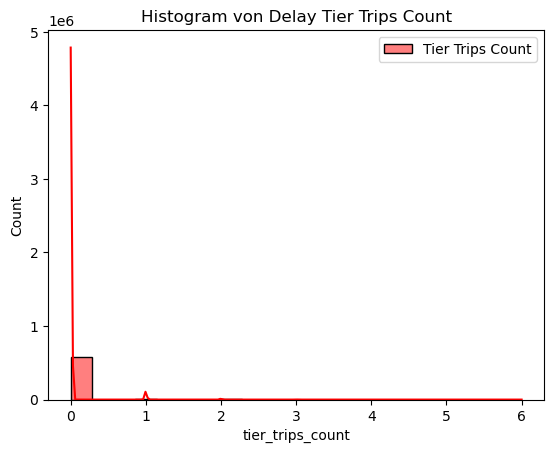

In [104]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(no_delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
#sns.histplot(delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
# sns.histplot(delay['arrival_delay'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

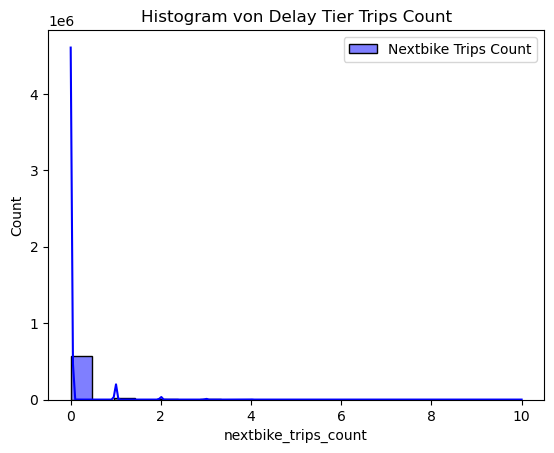

In [105]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(no_delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

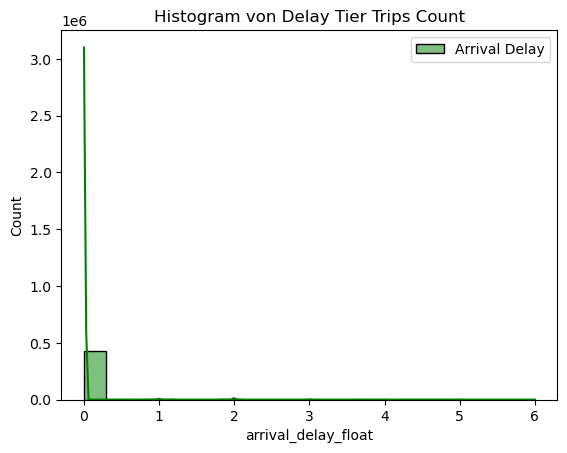

In [106]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(no_delay['arrival_delay_float'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

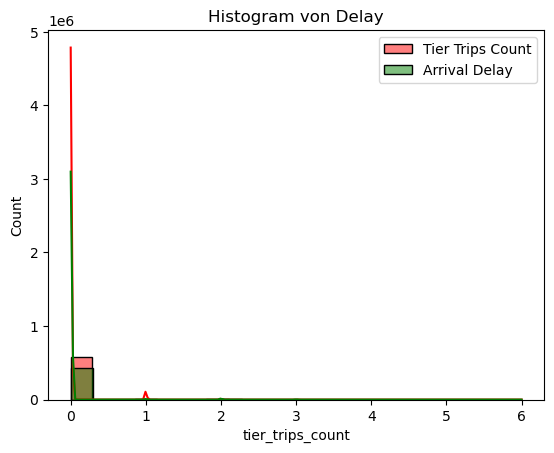

In [107]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(no_delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
sns.histplot(no_delay['arrival_delay_float'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay')
plt.show()

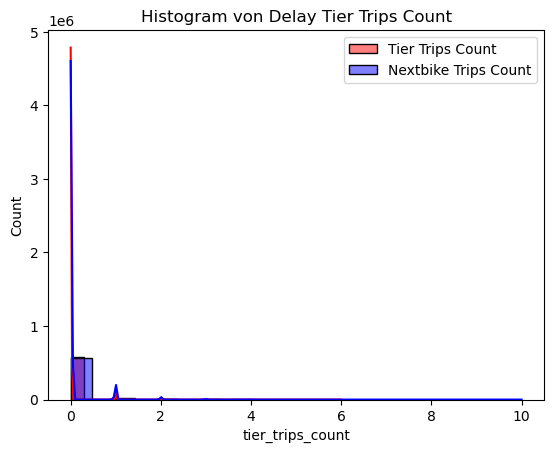

In [108]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(no_delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
sns.histplot(no_delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

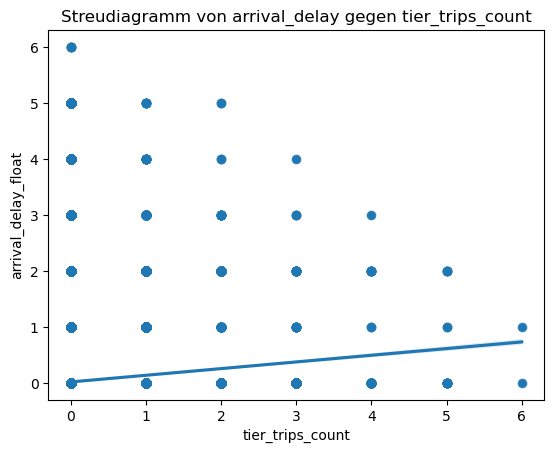

In [109]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(y='arrival_delay_float', x='tier_trips_count', data=no_delay)
sns.regplot(y ='arrival_delay_float', x='tier_trips_count', data=no_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

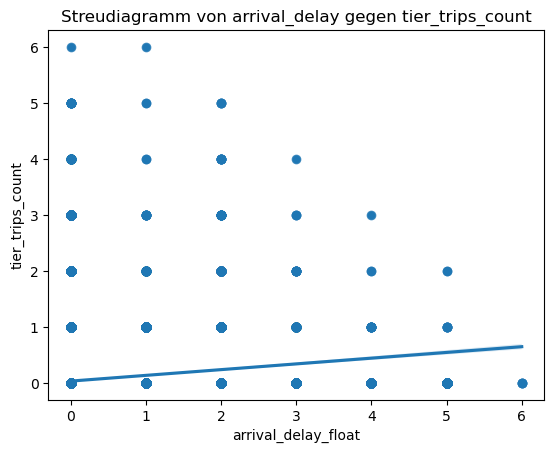

In [110]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay_float', y='tier_trips_count', data=no_delay)
sns.regplot(x ='arrival_delay_float', y='tier_trips_count', data=no_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

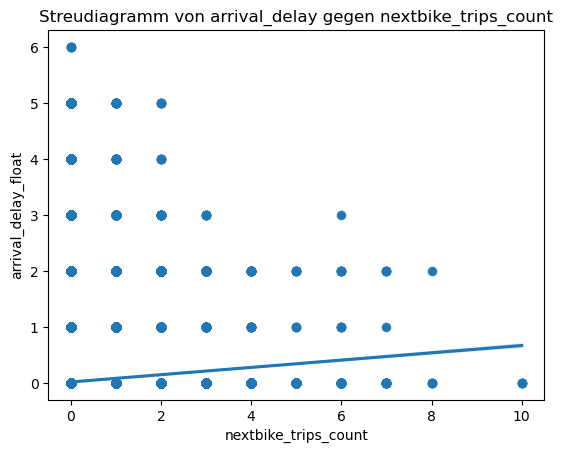

In [111]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(y='arrival_delay_float', x='nextbike_trips_count', data=no_delay)
sns.regplot(y ='arrival_delay_float', x='nextbike_trips_count', data=no_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

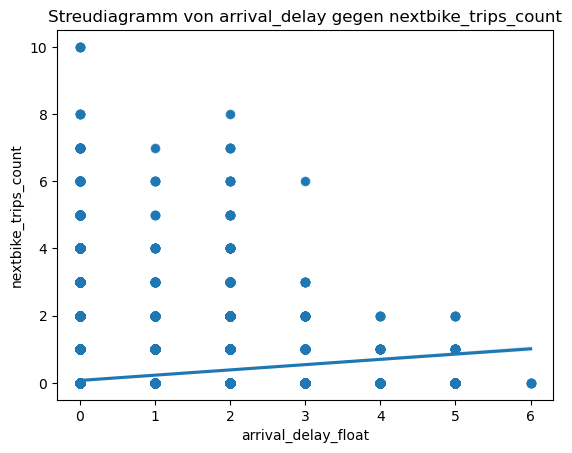

In [112]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay_float', y='nextbike_trips_count', data=no_delay)
sns.regplot(x ='arrival_delay_float', y='nextbike_trips_count', data=no_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

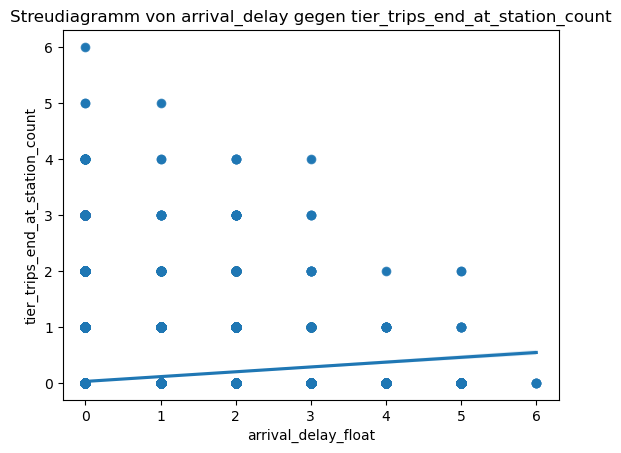

In [113]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay_float', y='tier_trips_end_at_station_count', data=no_delay)
sns.regplot(x ='arrival_delay_float', y='tier_trips_end_at_station_count', data=no_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_end_at_station_count')
plt.show()

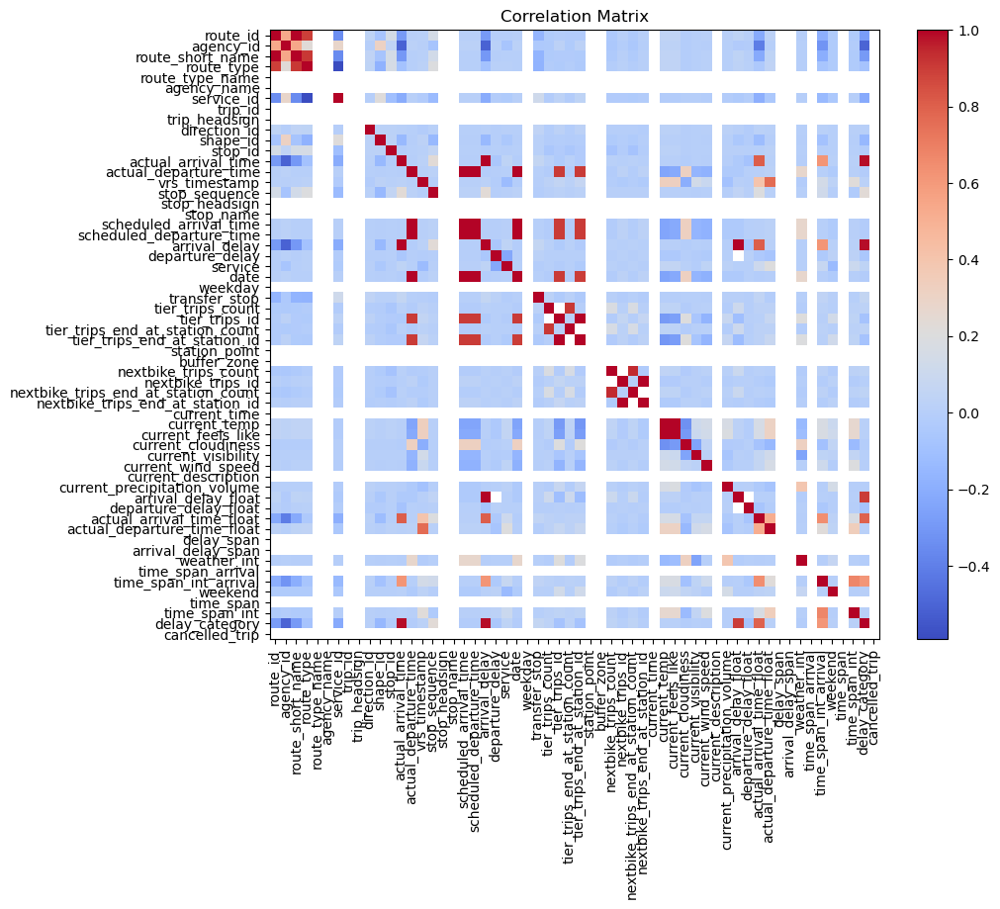

In [114]:
# Convert non-numeric columns to numeric data type
data1 = no_delay.apply(pd.to_numeric, errors='coerce')

# Calculate correlation matrix
correlation_matrix = data1.corr()
#print(correlation_matrix)

# Create correlation matrix
correlation_matrix = correlation_matrix

# Plot correlation matrix as heatmap
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title('Correlation Matrix')

# Save the plot in high resolution
plt.savefig('correlation_matrix.png', dpi=300)

### NaN

In [115]:
nan_delay = data[data['scheduled_arrival_time'].notna() & data['actual_arrival_time'].isna() & data['scheduled_departure_time'].notna() & data['actual_departure_time'].isna()]
#nan_delay = data[data['arrival_delay'].isna()]
nan_delay

,route_id,agency_id,route_short_name,route_type,route_type_name,agency_name,service_id,trip_id,trip_headsign,direction_id,...,delay_span,arrival_delay_span,weather_int,time_span_arrival,time_span_int_arrival,weekend,time_span,time_span_int,delay_category,cancelled_trip
41,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,255-551-008-2071.2.22:033200-34-157_C0741D60-B...,Bonn Hbf,1,...,0,0,0,0,0,1,0,0,-1,1
42,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,159-551-008-687.2.36:044000-33-157_FAA787CB-18...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,1
43,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,159-551-008-687.2.36:044000-33-157_FAA787CB-18...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,1
44,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,159-551-008-687.2.36:044000-33-157_FAA787CB-18...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,1
45,551,8,551,3,Bus,RSVG Rhein-Sieg-Verkehrsgesellschaft mbH,125,159-551-008-687.2.36:044000-33-157_FAA787CB-18...,Troisdorf Bf,0,...,0,0,0,0,0,1,0,0,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2564854,689,6,N9,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,43,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,Bonn Hbf,0,...,0,0,1,0,0,0,0,0,-1,1
2564856,689,6,N9,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,43,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,Bonn Hbf,0,...,0,0,1,0,0,0,0,0,-1,1
2564857,689,6,N9,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,43,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,Bonn Hbf,0,...,0,0,1,0,0,0,0,0,-1,1
2564858,689,6,N9,3,Bus,SWB Stadtwerke Bonn Verkehrs GmbH,43,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,Bonn Hbf,0,...,0,0,1,0,0,0,0,0,-1,1


In [116]:
nan_delay.describe()

,route_id,agency_id,route_type,service_id,direction_id,shape_id,stop_id,actual_arrival_time,actual_departure_time,vrs_timestamp,...,departure_delay_float,actual_arrival_time_float,actual_departure_time_float,arrival_delay_span,weather_int,time_span_int_arrival,weekend,time_span_int,delay_category,cancelled_trip
count,1.005613e+06,1.005613e+06,1.005613e+06,1.005613e+06,1.005613e+06,1.005613e+06,1.005613e+06,0,0,1.005613e+06,...,0.0,1005613.0,1005613.0,1005613.0,1.005613e+06,1005613.0,1.005613e+06,1005613.0,1005613.0,1005613.0
mean,5.538884e+02,6.293187e+00,2.668441e+00,4.052202e+03,4.886413e-01,4.066712e+03,2.254768e+03,NaT,NaT,1.261300e+05,...,NaN,0.0,0.0,0.0,1.794110e-01,0.0,6.679617e-01,0.0,-1.0,1.0
min,1.600000e+01,1.000000e+00,0.000000e+00,3.000000e+00,0.000000e+00,6.000000e+00,4.300000e+01,NaT,NaT,1.305000e+03,...,NaN,0.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,-1.0,1.0
25%,6.010000e+02,6.000000e+00,3.000000e+00,6.400000e+01,0.000000e+00,1.974000e+03,1.214000e+03,NaT,NaT,8.380500e+04,...,NaN,0.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,-1.0,1.0
50%,6.070000e+02,6.000000e+00,3.000000e+00,6.400000e+01,0.000000e+00,2.952000e+03,1.456000e+03,NaT,NaT,1.243040e+05,...,NaN,0.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,-1.0,1.0
75%,6.130000e+02,6.000000e+00,3.000000e+00,1.300000e+02,1.000000e+00,6.327000e+03,1.685000e+03,NaT,NaT,1.643050e+05,...,NaN,0.0,0.0,0.0,0.000000e+00,0.0,1.000000e+00,0.0,-1.0,1.0
max,8.840000e+02,1.200000e+01,3.000000e+00,2.914500e+04,1.000000e+00,1.039600e+04,9.780000e+03,NaT,NaT,2.358070e+05,...,NaN,0.0,0.0,0.0,2.000000e+00,0.0,3.000000e+00,0.0,-1.0,1.0
std,1.832842e+02,1.196105e+00,9.406096e-01,9.539435e+03,4.998712e-01,2.915055e+03,2.342219e+03,NaN,NaN,5.041465e+04,...,NaN,0.0,0.0,0.0,4.503408e-01,0.0,9.583452e-01,0.0,0.0,0.0


In [117]:
show_short_df(nan_delay).describe()

,route_id,stop_id,scheduled_arrival_time,actual_arrival_time,scheduled_departure_time,actual_departure_time,arrival_delay,departure_delay,tier_trips_count,tier_trips_end_at_station_count,nextbike_trips_count,nextbike_trips_end_at_station_count,arrival_delay_float,departure_delay_float
count,1.005613e+06,1.005613e+06,1005613,0,1005613,0,0,0,1.005613e+06,1.005613e+06,1.005613e+06,1.005613e+06,0.0,0.0
mean,5.538884e+02,2.254768e+03,2023-07-16 12:14:31.630618112,NaT,2023-07-16 12:14:33.215024384,NaT,NaT,NaT,1.896057e-02,1.530808e-02,4.792897e-02,3.997064e-02,NaN,NaN
min,1.600000e+01,4.300000e+01,2023-06-30 04:20:00,NaT,2023-06-30 04:20:00,NaT,NaT,NaT,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN
25%,6.010000e+02,1.214000e+03,2023-07-07 20:54:00,NaT,2023-07-07 20:54:00,NaT,NaT,NaT,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN
50%,6.070000e+02,1.456000e+03,2023-07-15 18:05:00,NaT,2023-07-15 18:05:00,NaT,NaT,NaT,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN
75%,6.130000e+02,1.685000e+03,2023-07-24 20:06:00,NaT,2023-07-24 20:06:00,NaT,NaT,NaT,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN
max,8.840000e+02,9.780000e+03,2023-08-01 03:25:00,NaT,2023-08-01 03:25:00,NaT,NaT,NaT,6.000000e+00,5.000000e+00,1.100000e+01,9.000000e+00,NaN,NaN
std,1.832842e+02,2.342219e+03,NaN,NaN,NaN,NaN,NaT,NaT,1.515670e-01,1.346278e-01,2.699462e-01,2.413699e-01,NaN,NaN


In [118]:
nan_delay.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1005613 entries, 41 to 2564860
Data columns (total 58 columns):
 #   Column                               Non-Null Count    Dtype          
---  ------                               --------------    -----          
 0   route_id                             1005613 non-null  int64          
 1   agency_id                            1005613 non-null  int64          
 2   route_short_name                     1005613 non-null  object         
 3   route_type                           1005613 non-null  int64          
 4   route_type_name                      1005613 non-null  object         
 5   agency_name                          1005613 non-null  object         
 6   service_id                           1005613 non-null  int64          
 7   trip_id                              1005613 non-null  object         
 8   trip_headsign                        1005613 non-null  object         
 9   direction_id                         10056

In [119]:
get_stats(nan_delay, ['tier_trips_count', 'tier_trips_end_at_station_count', 'nextbike_trips_count', 'nextbike_trips_end_at_station_count', 'current_temp', 'current_precipitation_volume'])

/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:54: RuntimeWarning: invalid value encountered in scalar divide
  cvqd = iqr / (percentile_75 + percentile_25)
/tmp/ipykernel_1792225/2742331914.py:50: RuntimeWarning: invalid value encountered in scalar divide
  qd = iqr / (percentile

column,tier_trips_count,tier_trips_end_at_station_count,nextbike_trips_count,nextbike_trips_end_at_station_count,current_temp,current_precipitation_volume
number of rows,1005613,1005613,1005613,1005613,1005613,1005613
sum,19067,15394,48198,40195,21100423.21,89175.55
mean,0.018961,0.015308,0.047929,0.039971,20.982648,0.621099
median,0.0,0.0,0.0,0.0,20.59,0.33
mode,"0 0 Name: tier_trips_count, dtype: int64","0 0 Name: tier_trips_end_at_station_count, ...","0 0 Name: nextbike_trips_count, dtype: int64",0 0 Name: nextbike_trips_end_at_station_cou...,"0 19.72 Name: current_temp, dtype: float64","0 0.21 Name: current_precipitation_volume, ..."
max,6,5,11,9,35.37,3.89
min,0,0,0,0,11.13,0.11
std_dev,0.151567,0.134628,0.269946,0.24137,4.138672,0.718824
variance,0.022973,0.018125,0.072871,0.058259,17.128602,0.516708
skewness,9.693251,10.440013,8.27752,8.551582,0.609189,2.812689


In [120]:
show_short_df(no_delay)

,route_id,trip_id,stop_id,stop_name,scheduled_arrival_time,actual_arrival_time,scheduled_departure_time,actual_departure_time,arrival_delay,departure_delay,tier_trips_count,tier_trips_end_at_station_count,nextbike_trips_count,nextbike_trips_end_at_station_count,buffer_zone,arrival_delay_float,departure_delay_float
0,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,687,Bonn Hbf,2023-06-30 01:40:00,NaT,2023-06-30 01:40:00,2023-07-01 01:40:00,NaT,1 days,1,1,0,0,"POLYGON ((7.09988 50.73234, 7.09992 50.73217, ...",NaN,0.0
1,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1106,Bonn Thomas-Mann-Str.,2023-06-30 01:42:00,NaT,2023-06-30 01:42:00,2023-07-01 01:42:00,NaT,1 days,0,0,0,0,"POLYGON ((7.09762 50.73411, 7.09766 50.73393, ...",NaN,0.0
2,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1102,Bonn Friedensplatz,2023-06-30 01:44:00,NaT,2023-06-30 01:44:00,2023-07-01 01:44:00,NaT,1 days,0,0,0,0,"POLYGON ((7.10040 50.73662, 7.10044 50.73644, ...",NaN,0.0
3,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1115,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,2023-06-30 01:46:00,NaT,2023-06-30 01:46:00,2023-07-01 01:46:00,NaT,1 days,0,0,0,0,"POLYGON ((7.10523 50.73780, 7.10527 50.73763, ...",NaN,0.0
4,551,93-551-008-687.2.36:014000-33-157_49E69401-92E...,1500,Bonn Konrad-Adenauer-Platz,2023-06-30 01:49:00,NaT,2023-06-30 01:49:00,2023-07-01 01:49:00,NaT,1 days,0,0,0,0,"POLYGON ((7.12019 50.73957, 7.12023 50.73939, ...",NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2564809,688,6880005-688-006-687.2.32:263500-36-1_5350170A-...,1580,Bonn Broichstr.,2023-08-01 03:08:00,2023-08-01 03:07:45,2023-08-01 03:08:00,2023-08-01 03:08:00,0 days,0 days,0,0,0,0,"POLYGON ((7.14525 50.73530, 7.14529 50.73513, ...",0.0,0.0
2564811,687,6870005-687-006-687.2.24:263500-34-1_F0CE2D00-...,1760,Bonn Deichmanns Aue,2023-08-01 03:09:00,2023-08-01 03:08:45,2023-08-01 03:09:00,2023-08-01 03:09:00,0 days,0 days,0,0,0,0,"POLYGON ((7.18257 50.67137, 7.18260 50.67120, ...",0.0,0.0
2564817,684,6840005-684-006-687.2.32:263500-36-1_7F56FE12-...,1557,Bonn Niederholtorf Kirche,2023-08-01 03:09:00,2023-08-01 03:08:45,2023-08-01 03:09:00,2023-08-01 03:09:00,0 days,0 days,0,0,0,0,"POLYGON ((7.18825 50.73116, 7.18829 50.73099, ...",0.0,0.0
2564834,689,6890005-689-006-687.2.34:263500-53-1_2AFE8F0F-...,1458,Bonn Grootestr.,2023-08-01 03:13:00,2023-08-01 03:12:45,2023-08-01 03:13:00,2023-08-01 03:13:00,0 days,0 days,0,0,0,0,"POLYGON ((7.05016 50.73927, 7.05020 50.73910, ...",0.0,0.0


In [121]:
# check Tier data for delay
nan_delay_tier = check_micromobility_datasets('tier', nan_delay)

In [122]:
nan_delay_tier.describe()

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,9.977000e+03,9977,9977,9977,9977.000000,9977.000000,7472.000000,5205.000000,9977.000000
mean,7.988750e+08,2023-07-15 11:20:33.046005760,2023-07-15 11:34:50.931141632,0 days 00:14:17.885135812,1.774328,1774.328011,1326.862687,1411.824784,857.885136
min,7.822645e+08,2023-07-01 01:25:00,2023-07-01 01:40:00,0 days 00:05:00,0.100042,100.042262,43.000000,43.000000,300.000000
25%,7.823754e+08,2023-07-07 15:15:00,2023-07-07 15:30:00,0 days 00:10:00,0.750246,750.246360,689.000000,1102.000000,600.000000
50%,8.086324e+08,2023-07-14 11:30:00,2023-07-14 11:45:00,0 days 00:10:00,1.354794,1354.794371,1115.000000,1145.000000,600.000000
75%,8.087480e+08,2023-07-22 18:00:00,2023-07-22 18:20:00,0 days 00:15:00,2.331417,2331.417317,1292.000000,1255.000000,900.000000
max,8.323115e+08,2023-07-31 23:15:00,2023-07-31 23:30:00,0 days 01:55:00,13.908704,13908.703513,9703.000000,9780.000000,6900.000000
std,1.683916e+07,NaN,NaN,0 days 00:09:59.928271605,1.514350,1514.349662,1366.966981,1459.135390,599.928272


In [123]:
# get entries where trips start and end at station
nan_delay_tier_station_station = nan_delay_tier[nan_delay_tier['end_stop_id'].notna() & nan_delay_tier['start_stop_id'].notna()]
nan_delay_tier_station_station

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,vehicle type,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,start_stop_name,start_buffer_zone,end_stop_id,end_stop_name,end_buffer_zone,trip_duration_seconds,start_location,end_location
3190399,782373031,2023-07-01 01:25:00,2023-07-01 01:40:00,e-scooter,0 days 00:15:00,1.055901,1055.901028,686.0,Bonn Universität/Markt,801621 POLYGON ((7.157885983913106 50.7227...,1110.0,Bonn Wilhelmsplatz,801621 ...,900.0,POINT (7.10146 50.73271),POINT (7.09772 50.74150)
3209527,782391260,2023-07-01 01:45:00,2023-07-01 01:50:00,e-scooter,0 days 00:05:00,0.670973,670.973151,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,687.0,Bonn Hbf,801621 ...,300.0,POINT (7.10180 50.73728),POINT (7.09852 50.73217)
3210269,782391943,2023-07-01 01:45:00,2023-07-01 01:50:00,e-scooter,0 days 00:05:00,0.838693,838.692953,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,687.0,Bonn Hbf,801621 ...,300.0,POINT (7.10410 50.73699),POINT (7.09815 50.73232)
3201996,782383745,2023-07-01 02:20:00,2023-07-01 02:25:00,e-scooter,0 days 00:05:00,0.567479,567.479089,687.0,Bonn Hbf,801621 POLYGON ((7.157885983913106 50.7227...,1103.0,Bonn Markt,801621 ...,300.0,POINT (7.09831 50.73236),POINT (7.10279 50.73481)
3276897,782452649,2023-07-01 02:20:00,2023-07-01 02:25:00,e-scooter,0 days 00:05:00,0.589011,589.011497,687.0,Bonn Hbf,801621 POLYGON ((7.157885983913106 50.7227...,1103.0,Bonn Markt,801621 ...,300.0,POINT (7.09832 50.73240),POINT (7.10306 50.73479)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3422524,832205249,2023-07-31 22:25:00,2023-07-31 22:45:00,e-scooter,0 days 00:20:00,1.197806,1197.806121,686.0,Bonn Universität/Markt,801621 POLYGON ((7.157885983913106 50.7227...,1153.0,Bonn Heerstr.,801621 ...,1200.0,POINT (7.10022 50.73309),POINT (7.09036 50.73745)
3485596,832265817,2023-07-31 22:25:00,2023-07-31 22:45:00,e-scooter,0 days 00:20:00,1.171579,1171.578745,686.0,Bonn Universität/Markt,801621 POLYGON ((7.157885983913106 50.7227...,1153.0,Bonn Heerstr.,801621 ...,1200.0,POINT (7.10025 50.73326),POINT (7.09058 50.73749)
3518645,832297525,2023-07-31 22:55:00,2023-07-31 23:00:00,e-scooter,0 days 00:05:00,0.704362,704.361980,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,1161.0,Bonn An Der Esche,801621 ...,300.0,POINT (7.10309 50.73744),POINT (7.10055 50.74329)
3420883,832203680,2023-07-31 23:00:00,2023-07-31 23:05:00,e-scooter,0 days 00:05:00,0.369227,369.226899,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 POLYGON ((7.157885983913106 50.7227...,1115.0,Bonn Bertha-Von-Suttner-Pl./Beethovenhaus,801621 ...,300.0,POINT (7.10130 50.73766),POINT (7.10442 50.73650)


In [124]:
nan_delay_tier_station_station.describe()

,tier_trips_id,tier_trips_start_time,tier_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,4.472000e+03,4472,4472,4472,4472.000000,4472.000000,4472.000000,4472.000000,4472.000000
mean,7.984864e+08,2023-07-15 07:51:00.845259520,2023-07-15 08:04:08.761180672,0 days 00:13:07.915921288,1.479684,1479.684184,1368.567308,1417.690072,787.915921
min,7.822645e+08,2023-07-01 01:25:00,2023-07-01 01:40:00,0 days 00:05:00,0.100174,100.173813,43.000000,43.000000,300.000000
25%,7.823711e+08,2023-07-07 15:53:45,2023-07-07 16:08:45,0 days 00:10:00,0.641841,641.841484,699.000000,1103.000000,600.000000
50%,8.086266e+08,2023-07-13 20:10:00,2023-07-13 20:20:00,0 days 00:10:00,1.177382,1177.381995,1115.000000,1150.000000,600.000000
75%,8.087473e+08,2023-07-22 16:45:00,2023-07-22 17:02:30,0 days 00:15:00,1.972956,1972.955729,1240.000000,1245.000000,900.000000
max,8.323115e+08,2023-07-31 23:15:00,2023-07-31 23:25:00,0 days 01:55:00,13.583168,13583.167599,9703.000000,9780.000000,6900.000000
std,1.683536e+07,NaN,NaN,0 days 00:09:00.617823045,1.210390,1210.389767,1407.526431,1416.018773,540.617823


In [125]:
# get statistics for the tier trips that start and end at a station
get_stats(nan_delay_tier_station_station, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,4472,4472
sum,3523560.0,6617.14767
mean,787.915921,1.479684
median,600.0,1.177382
mode,"0 600.0 Name: trip_duration_seconds, dtype:...",0 0.100174 1 0.100246 2 0...
max,6900.0,13.583168
min,300.0,0.100174
std_dev,540.617823,1.21039
variance,292267.630594,1.465043
skewness,4.380747,2.058274


In [126]:
nan_delay_next = check_micromobility_datasets('next', nan_delay)

In [127]:
nan_delay_next.describe()

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,2.552100e+04,25521,25521,25521,25521.000000,25521.000000,20321.000000,14808.000000,25521.000000
mean,3.793938e+07,2023-07-15 14:26:58.034560,2023-07-15 14:41:38.309627392,0 days 00:14:40.275067591,1.705999,1705.999177,1182.937257,1251.842990,880.275068
min,3.771653e+07,2023-07-01 01:56:00,2023-07-01 02:06:00,0 days 00:05:00,0.100004,100.003661,43.000000,43.000000,300.000000
25%,3.782718e+07,2023-07-07 14:56:00,2023-07-07 15:11:00,0 days 00:10:00,0.777028,777.028121,687.000000,699.000000,600.000000
50%,3.794134e+07,2023-07-14 14:51:00,2023-07-14 15:11:00,0 days 00:10:00,1.316987,1316.987300,1115.000000,1144.000000,600.000000
75%,3.804921e+07,2023-07-22 17:31:00,2023-07-22 17:41:00,0 days 00:15:00,2.189589,2189.589411,1221.000000,1221.000000,900.000000
max,3.817174e+07,2023-08-01 03:21:00,2023-08-01 03:31:00,0 days 02:00:00,14.104859,14104.859070,9780.000000,9780.000000,7200.000000
std,1.285653e+05,NaN,NaN,0 days 00:09:39.809478120,1.424317,1424.317182,1068.951173,1160.071674,579.809478


In [128]:
get_stats(nan_delay_next, ['trip_duration_seconds', 'trip_distance_kilometers'])

column,trip_duration_seconds,trip_distance_kilometers
number of rows,25521,25521
sum,22465500.0,43538.804985
mean,880.275068,1.705999
median,600.0,1.316987
mode,"0 600.0 Name: trip_duration_seconds, dtype:...","0 0.870199 Name: trip_distance_kilometers, ..."
max,7200.0,14.104859
min,300.0,0.100004
std_dev,579.809478,1.424317
variance,336179.030918,2.028679
skewness,4.002606,2.236964


In [129]:
# get entries where trips start and end at station
nan_delay_next_station_station = nan_delay_next[nan_delay_next['end_stop_id'].notna() & nan_delay_next['start_stop_id'].notna()]
nan_delay_next_station_station

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,nextbike_trips_start_at_station,nextbike_trips_end_at_station,vehicle type,trip_duration,trip_distance_kilometers,trip_distance_meters,start_location,end_location,start_stop_id,start_stop_name,start_buffer_zone,end_stop_id,end_stop_name,end_buffer_zone,trip_duration_seconds
1635116,37766535,2023-07-01 05:16:00,2023-07-01 05:26:00,False,True,bike,0 days 00:10:00,1.003667,1003.666723,"b""\x01\x01\x00\x00\x00Z\xb7A\xed\xb7\x96\x1c@L...",b'\x01\x01\x00\x00\x00t\xef\xe1\x92\xe3\x9e\x1...,8950.0,Bonn Schießbergweg,215356 ...,1584.0,Bonn Ramersdorf,215356 POLYGON ((7.120193524138334 50.7395...,600.0
1444489,38015256,2023-07-01 05:31:00,2023-07-01 05:36:00,False,True,bike,0 days 00:05:00,0.109052,109.052108,b'\x01\x01\x00\x00\x00\x0c@\xa3t\xe9/\x1c@\x1c...,b'\x01\x01\x00\x00\x00W\xb2c#\x10/\x1c@ap\xcd\...,694.0,Bonn Tannenbusch Mitte,215356 ...,694.0,Bonn Tannenbusch Mitte,215356 POLYGON ((7.120193524138334 50.7395...,300.0
1311817,37850625,2023-07-01 06:21:00,2023-07-01 06:36:00,False,False,bike,0 days 00:15:00,1.284558,1284.557726,b'\x01\x01\x00\x00\x00}\xeb\xc3z\xa3f\x1c@}\xc...,b'\x01\x01\x00\x00\x001\x08\xac\x1cZd\x1c@C\x9...,1160.0,Bonn Nordstr.,215356 ...,687.0,Bonn Hbf,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1433891,38006735,2023-07-01 06:21:00,2023-07-01 06:36:00,False,False,bike,0 days 00:15:00,1.550245,1550.245342,b'\x01\x01\x00\x00\x00\xa9lXSYT\x1c@\xb0\xe6\x...,b'\x01\x01\x00\x00\x00\xdapX\x1a\xf8a\x1c@(\x0...,1221.0,Bonn Kaufmannstr.,215356 ...,687.0,Bonn Hbf,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1471081,38035639,2023-07-01 06:26:00,2023-07-01 06:41:00,False,False,bike,0 days 00:15:00,1.898569,1898.568609,b'\x01\x01\x00\x00\x00\xbb\x99\xd1\x8f\x86c\x1...,b'\x01\x01\x00\x00\x00#.\x00\x8d\xd2e\x1c@\xd5...,687.0,Bonn Hbf,215356 ...,1174.0,Bonn Augustinum,215356 POLYGON ((7.120193524138334 50.7395...,900.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1539405,38089363,2023-07-31 23:31:00,2023-07-31 23:41:00,False,False,bike,0 days 00:10:00,1.037686,1037.686290,b'\x01\x01\x00\x00\x00\xf6z\xf7\xc7{e\x1c@\xfe...,b'\x01\x01\x00\x00\x00\x12\xdar.\xc5e\x1c@r\xf...,687.0,Bonn Hbf,215356 ...,1133.0,Bonn Luisenstr.,215356 POLYGON ((7.120193524138334 50.7395...,600.0
1592910,37753445,2023-07-31 23:31:00,2023-07-31 23:56:00,False,False,bike,0 days 00:25:00,4.197185,4197.185304,b'\x01\x01\x00\x00\x00\xa5\xa2\xb1\xf6wv\x1c@\...,b'\x01\x01\x00\x00\x00\xbb%9`WS\x1c@#2\xac\xe2...,1500.0,Bonn Konrad-Adenauer-Platz,215356 ...,1231.0,Bonn Sebastianstr.,215356 POLYGON ((7.120193524138334 50.7395...,1500.0
1250204,37733796,2023-07-31 23:56:00,2023-08-01 00:11:00,False,False,bike,0 days 00:15:00,2.822479,2822.478797,b'\x01\x01\x00\x00\x00\x8a \xce\xc3\t\\\x1c@Id...,b'\x01\x01\x00\x00\x00\x12/O\xe7\x8aB\x1c@\x02...,1153.0,Bonn Heerstr.,215356 ...,9702.0,Bonn Im Tannenbusch,215356 POLYGON ((7.120193524138334 50.7395...,900.0
1360122,37933008,2023-07-31 23:56:00,2023-08-01 00:01:00,True,False,bike,0 days 00:05:00,0.115054,115.054399,b'\x01\x01\x00\x00\x00\xa6}s\x7f\xf5h\x1c@\x92...,b'\x01\x01\x00\x00\x00\xc4AB\x94/h\x1c@D\xbf\x...,1103.0,Bonn Markt,215356 ...,1103.0,Bonn Markt,215356 POLYGON ((7.120193524138334 50.7395...,300.0


In [130]:
nan_delay_next_station_station.describe()

,nextbike_trips_id,nextbike_trips_start_time,nextbike_trips_end_time,trip_duration,trip_distance_kilometers,trip_distance_meters,start_stop_id,end_stop_id,trip_duration_seconds
count,1.263300e+04,12633,12633,12633,12633.000000,12633.000000,12633.000000,12633.000000,12633.000000
mean,3.794036e+07,2023-07-15 13:36:22.384231936,2023-07-15 13:49:55.639990528,0 days 00:13:33.255758727,1.416132,1416.132498,1212.093327,1276.789757,813.255759
min,3.771653e+07,2023-07-01 05:16:00,2023-07-01 05:26:00,0 days 00:05:00,0.100004,100.003661,43.000000,43.000000,300.000000
25%,3.782776e+07,2023-07-07 15:51:00,2023-07-07 16:01:00,0 days 00:10:00,0.715740,715.739804,687.000000,1102.000000,600.000000
50%,3.794221e+07,2023-07-14 12:51:00,2023-07-14 13:01:00,0 days 00:10:00,1.166140,1166.139876,1115.000000,1146.000000,600.000000
75%,3.804974e+07,2023-07-22 14:51:00,2023-07-22 15:06:00,0 days 00:15:00,1.801790,1801.790390,1221.000000,1221.000000,900.000000
max,3.817174e+07,2023-08-01 03:21:00,2023-08-01 03:31:00,0 days 02:00:00,9.640671,9640.671235,9780.000000,9780.000000,7200.000000
std,1.284580e+05,NaN,NaN,0 days 00:08:47.874484806,1.084326,1084.325533,1104.632986,1186.784673,527.874485


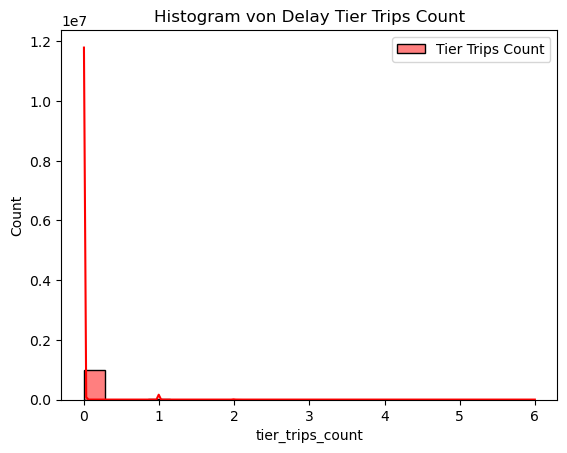

In [131]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(nan_delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
#sns.histplot(delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
# sns.histplot(delay['arrival_delay'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

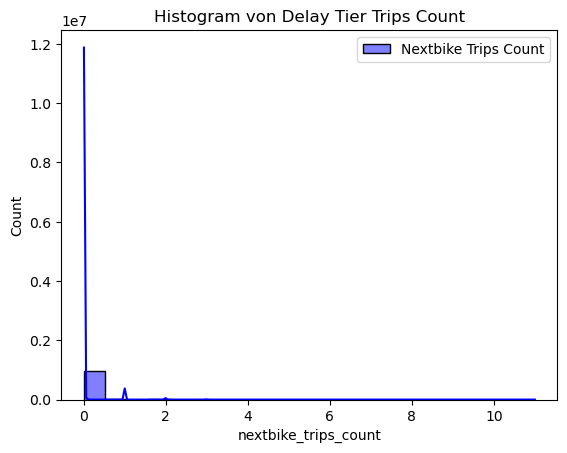

In [132]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(nan_delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

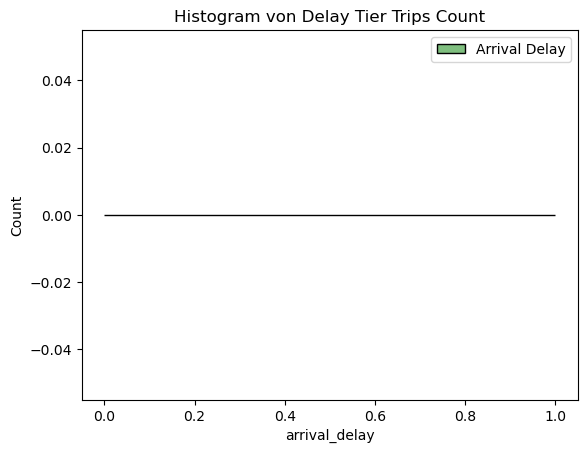

In [133]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(nan_delay['arrival_delay'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

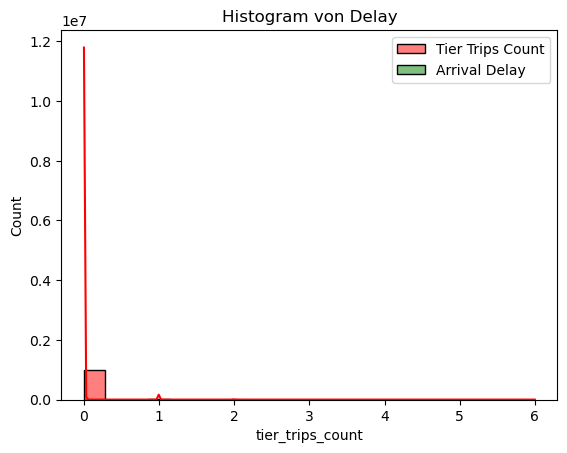

In [134]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(nan_delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
sns.histplot(nan_delay['arrival_delay'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay')
plt.show()

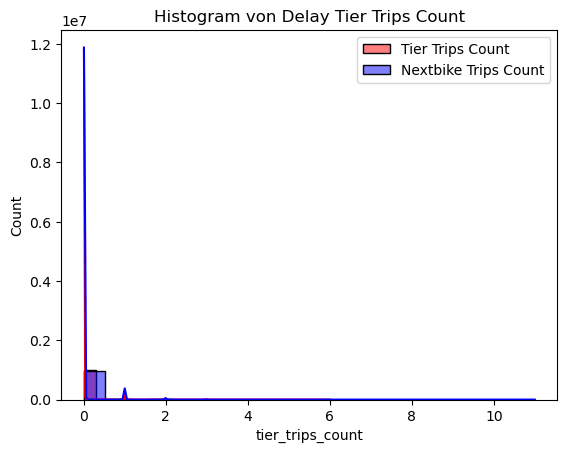

In [135]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(nan_delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
sns.histplot(nan_delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

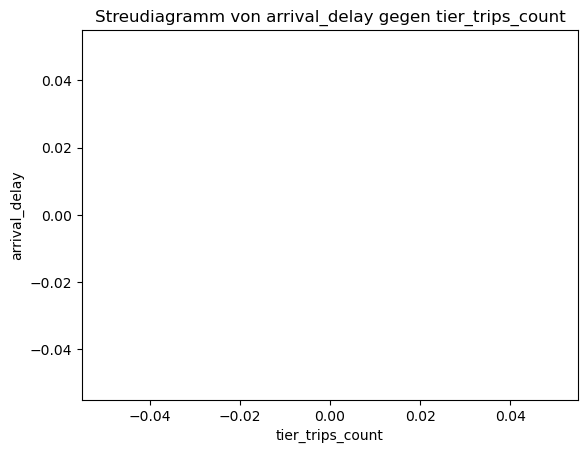

In [136]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(y='arrival_delay', x='tier_trips_count', data=nan_delay)
sns.regplot(y ='arrival_delay', x='tier_trips_count', data=nan_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

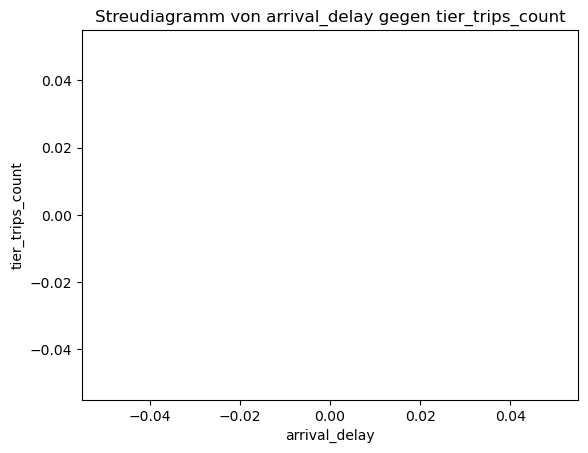

In [137]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay', y='tier_trips_count', data=nan_delay)
sns.regplot(x ='arrival_delay', y='tier_trips_count', data=nan_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

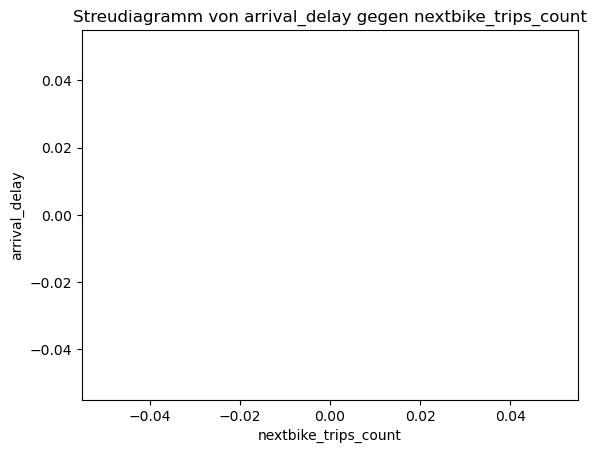

In [138]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(y='arrival_delay', x='nextbike_trips_count', data=nan_delay)
sns.regplot(y ='arrival_delay', x='nextbike_trips_count', data=nan_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

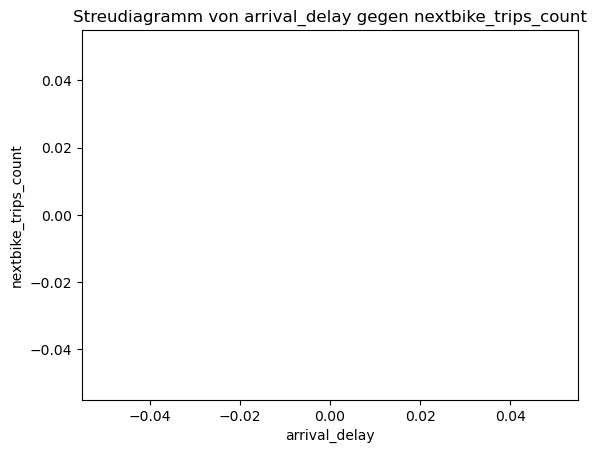

In [139]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay', y='nextbike_trips_count', data=nan_delay)
sns.regplot(x ='arrival_delay', y='nextbike_trips_count', data=nan_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

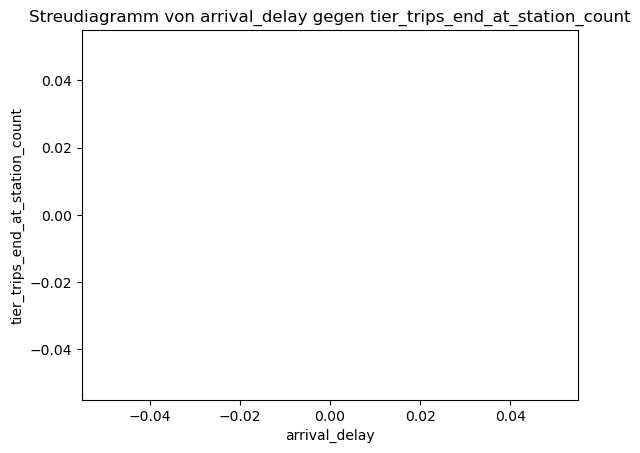

In [140]:
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay', y='tier_trips_end_at_station_count', data=nan_delay)
sns.regplot(x ='arrival_delay', y='tier_trips_end_at_station_count', data=nan_delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_end_at_station_count')
plt.show()

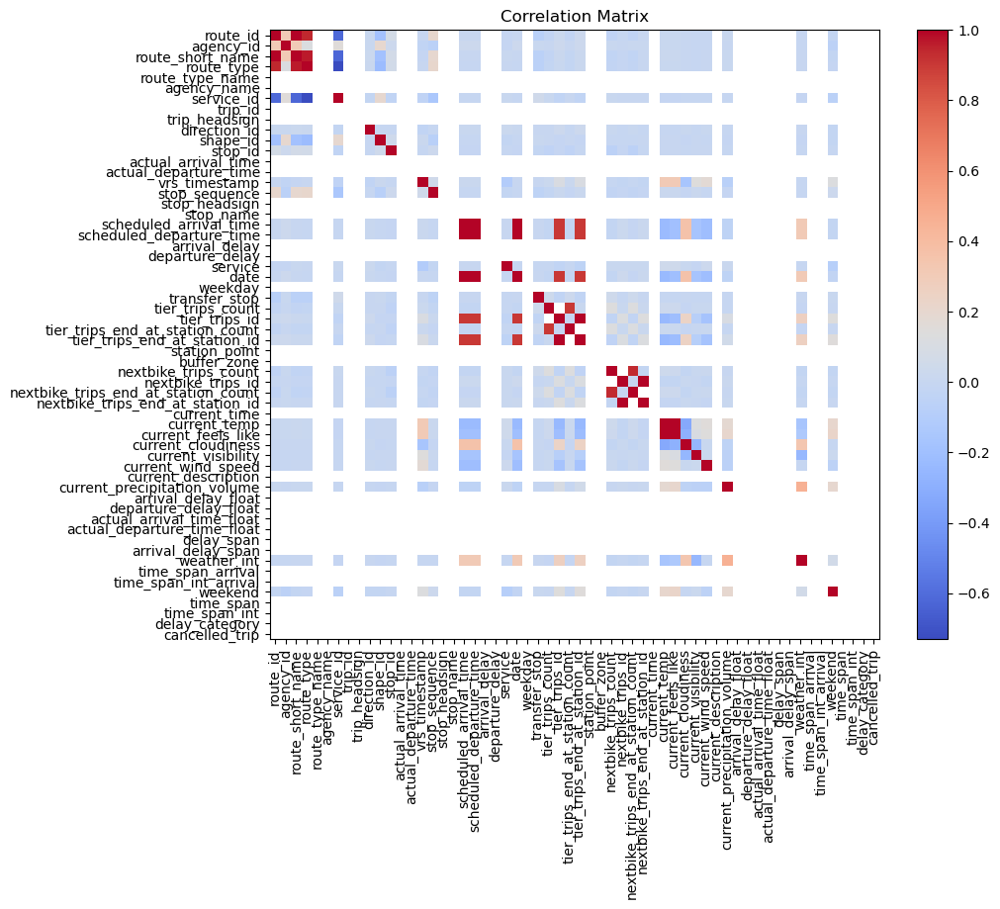

In [141]:
# Convert non-numeric columns to numeric data type
data1 = nan_delay.apply(pd.to_numeric, errors='coerce')

# Calculate correlation matrix
correlation_matrix = data1.corr()
#print(correlation_matrix)

# Create correlation matrix
correlation_matrix = correlation_matrix

# Plot correlation matrix as heatmap
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title('Correlation Matrix')

# Save the plot in high resolution
plt.savefig('correlation_matrix.png', dpi=300)

## Visualization

# Visuelle Inspektion
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(data['tier_trips_count'], kde=True)
plt.title('Histogram von tier_trips_count')

plt.subplot(1, 2, 2)
sns.boxplot(y=data['tier_trips_count'])
plt.title('Boxplot von tier_trips_count')

plt.show()

# Streudiagramm
plt.figure(figsize=(6, 6))
sns.scatterplot(x='arrival_delay', y='tier_trips_count', data=data)
plt.title('Streudiagramm von X gegen Y')
plt.show()

# QQ-Plot für Normalitätsprüfung
sm.qqplot(data['tier_trips_count'], line ='45')
plt.title('QQ-Plot von Y')
plt.show()

# Shapiro-Wilk-Test für Normalität
stat, p = stats.shapiro(data['Y'])
print('Shapiro-Wilk-Test: Statistik=%.3f, p=%.3f' % (stat, p))

# Hist Plot

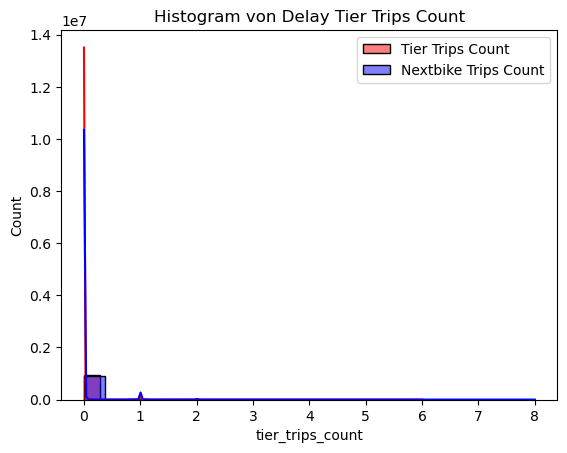

In [142]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
sns.histplot(delay['tier_trips_count'], kde=True, color='red', label='Tier Trips Count')
sns.histplot(delay['nextbike_trips_count'], kde=True, color='blue', label='Nextbike Trips Count')
# sns.histplot(delay['arrival_delay'], kde=True, color='green', label='Arrival Delay')
plt.legend()
plt.title('Histogram von Delay Tier Trips Count')
plt.show()

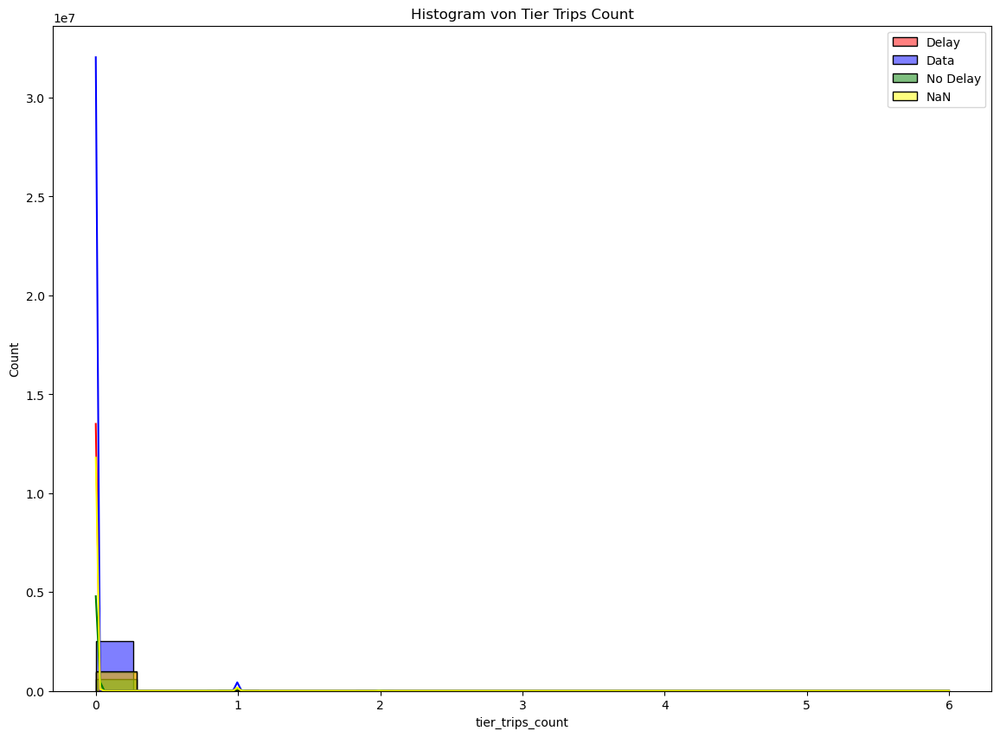

In [143]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
plt.figure(figsize=(14,10))
sns.histplot(delay['tier_trips_count'], kde=True, color='red', label='Delay')
sns.histplot(data['tier_trips_count'], kde=True, color='blue', label='Data')
sns.histplot(no_delay['tier_trips_count'], kde=True, color='green', label='No Delay')
sns.histplot(nan_delay['tier_trips_count'], kde=True, color='yellow', label='NaN')

plt.legend()
plt.title('Histogram von Tier Trips Count')
plt.show()

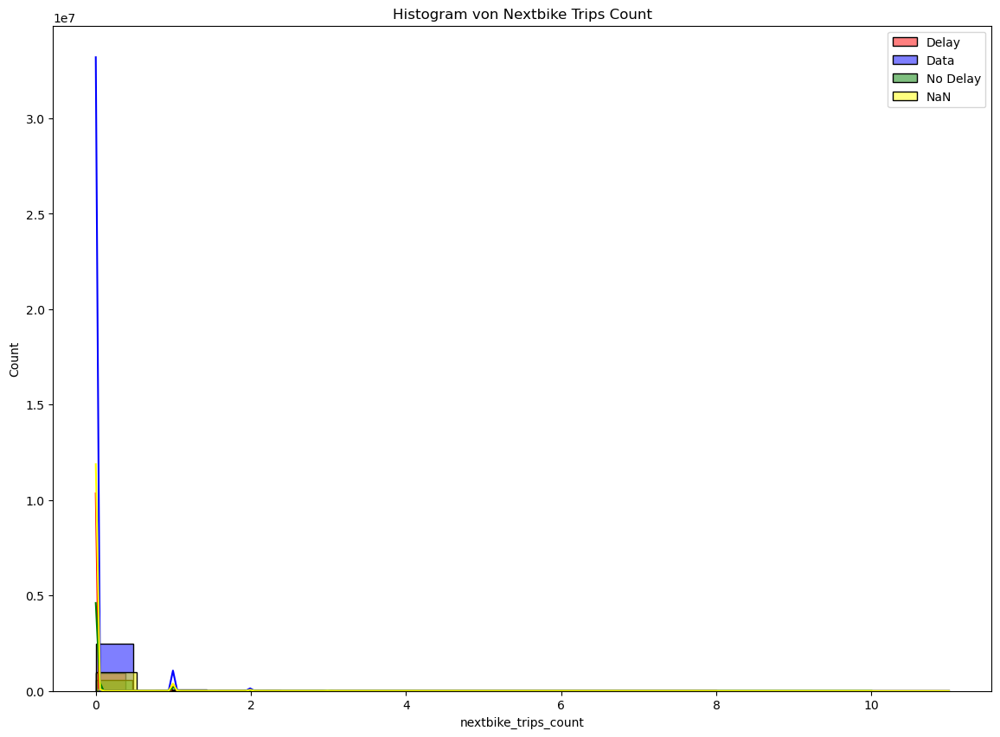

In [144]:
# Histplot
# Häufigkeitsverteilung einer eintelnen Variable
# Hilt zu verstehen, wie oft bestimmte Werte in den Daten vorkommen
plt.figure(figsize=(14,10))
sns.histplot(delay['nextbike_trips_count'], kde=True, color='red', label='Delay')
sns.histplot(data['nextbike_trips_count'], kde=True, color='blue', label='Data')
sns.histplot(no_delay['nextbike_trips_count'], kde=True, color='green', label='No Delay')
sns.histplot(nan_delay['nextbike_trips_count'], kde=True, color='yellow', label='NaN')

plt.legend()
plt.title('Histogram von Nextbike Trips Count')
plt.show()

# Boxplot

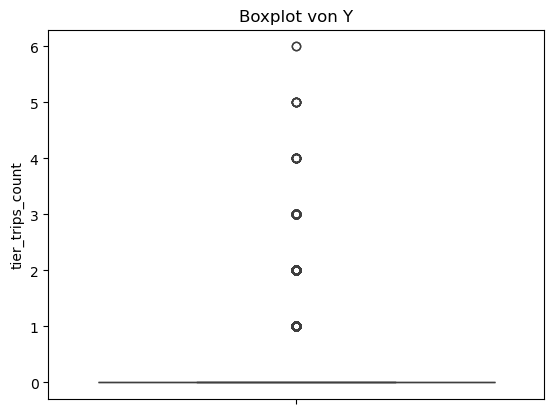

In [145]:
# boxplot
# Zeigt Vertielung der Daten und hebt Ausreißer hervor
# Zeigt Median, Quartile und Ausreißer
sns.boxplot(y=delay['tier_trips_count'])
plt.title('Boxplot von Y')
plt.show()

# Scatterplot

In [146]:
delay['arrival_delay'] = delay['arrival_delay'].dt.total_seconds()


/home/students/miniconda3/envs/Andrej/lib/python3.12/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [147]:
delay['departure_delay'] = delay['departure_delay'].dt.total_seconds()

In [148]:
no_delay['arrival_delay'] = no_delay['arrival_delay'].dt.total_seconds()
nan_delay['arrival_delay'] = nan_delay['arrival_delay'].dt.total_seconds()

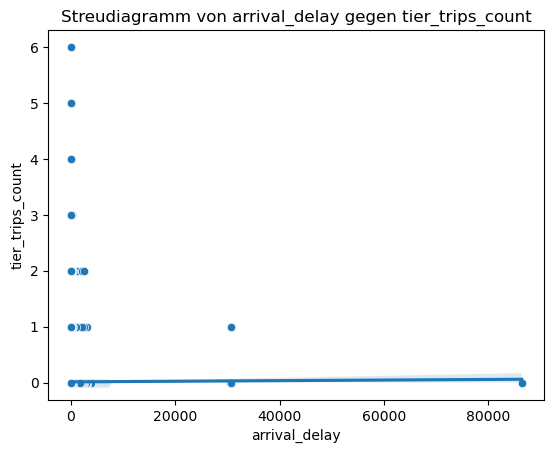

In [149]:
# Streudiagramm
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(x='arrival_delay', y='tier_trips_count', data=delay)
sns.regplot(x='arrival_delay', y='tier_trips_count', data=delay, scatter=False)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

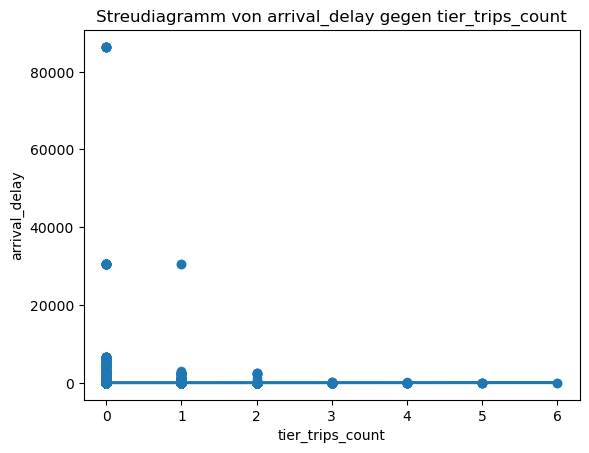

In [150]:
# Streudiagramm
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
sns.scatterplot(y='arrival_delay', x='tier_trips_count', data=delay)
sns.regplot(y ='arrival_delay', x='tier_trips_count', data=delay, scatter=True)

plt.title('Streudiagramm von arrival_delay gegen tier_trips_count')
plt.show()

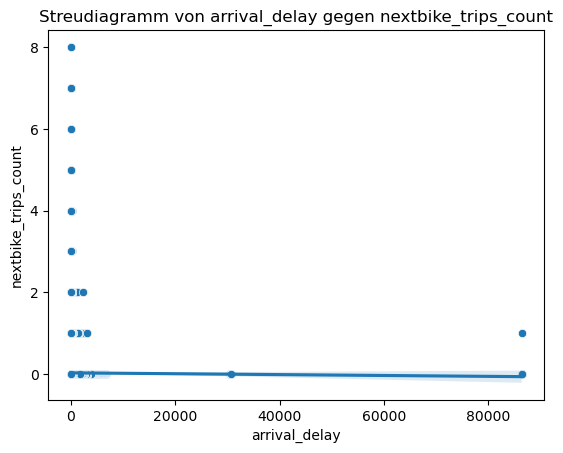

In [151]:
sns.scatterplot(x='arrival_delay', y='nextbike_trips_count', data=delay)
sns.regplot(x='arrival_delay', y='nextbike_trips_count', data=delay, scatter=False)
plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

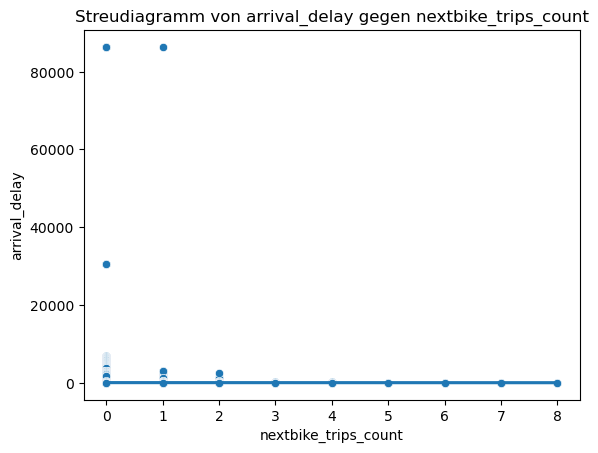

In [152]:
sns.scatterplot(y='arrival_delay', x='nextbike_trips_count', data=delay)
sns.regplot(y='arrival_delay', x='nextbike_trips_count', data=delay, scatter=False)
plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_count')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


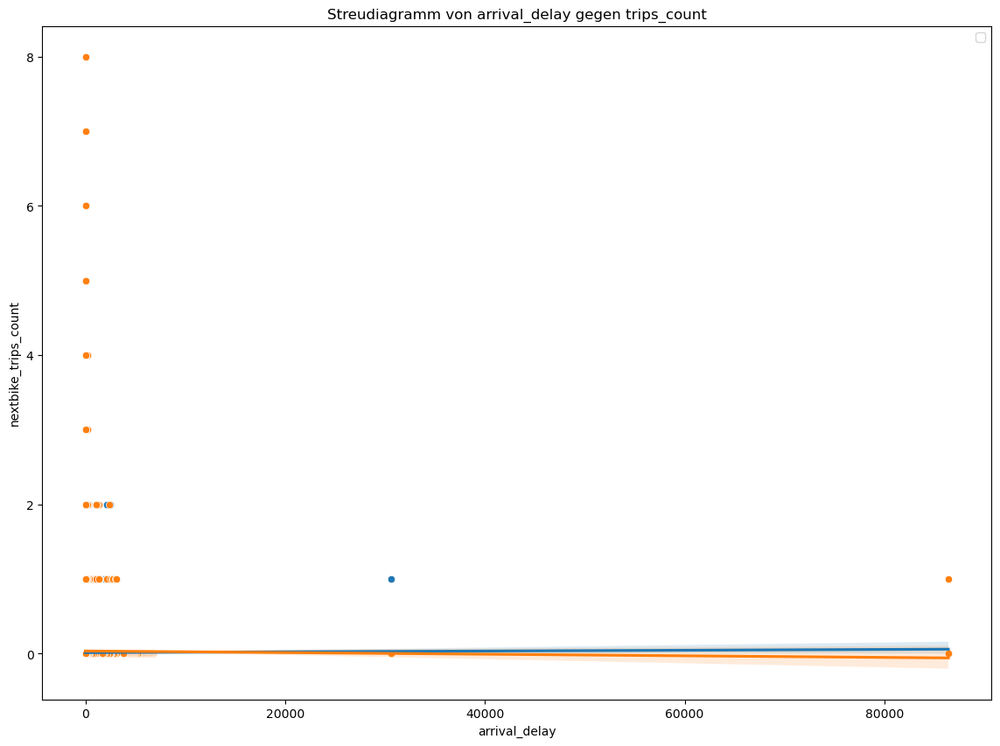

In [153]:
# Streudiagramm
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
plt.figure(figsize=(14,10))
sns.scatterplot(x='arrival_delay', y='tier_trips_count', data=delay)
sns.regplot(x='arrival_delay', y='tier_trips_count', data=delay, scatter=False)
sns.scatterplot(x='arrival_delay', y='nextbike_trips_count', data=delay)
sns.regplot(x='arrival_delay', y='nextbike_trips_count', data=delay, scatter=False)
plt.legend()
plt.title('Streudiagramm von arrival_delay gegen trips_count')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


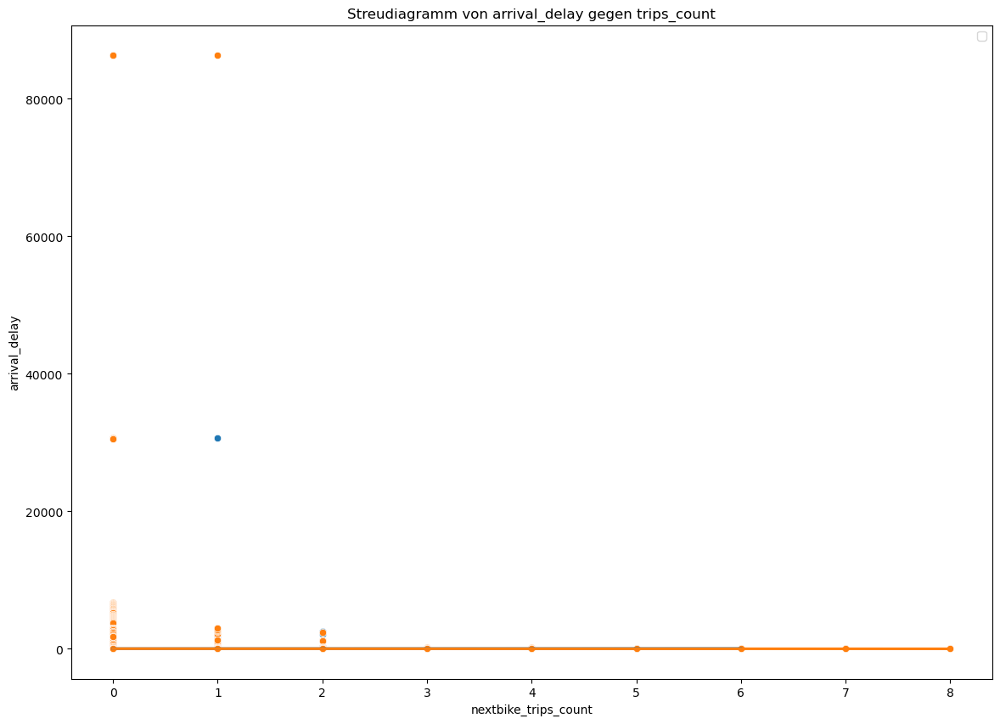

In [154]:
# Streudiagramm
# Zeigt Beziehung zwischen zwei kontinuirlihen Variablen
plt.figure(figsize=(14,10))
sns.scatterplot(y='arrival_delay', x='tier_trips_count', data=delay)
sns.regplot(y='arrival_delay', x='tier_trips_count', data=delay, scatter=False)
sns.scatterplot(y='arrival_delay', x='nextbike_trips_count', data=delay)
sns.regplot(y = 'arrival_delay', x='nextbike_trips_count', data=delay, scatter=False)
plt.legend()
plt.title('Streudiagramm von arrival_delay gegen trips_count')
plt.show()

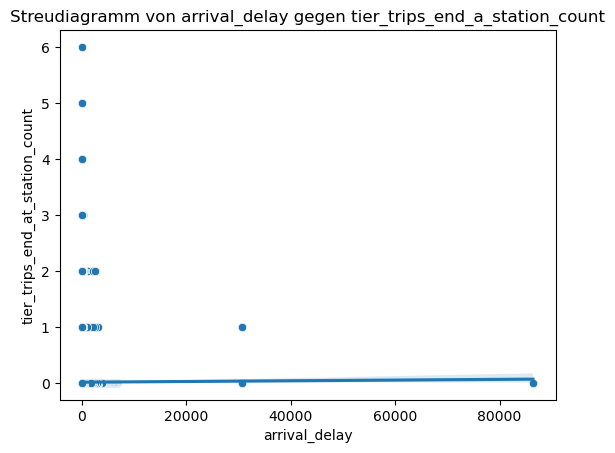

In [155]:
sns.scatterplot(x='arrival_delay', y='tier_trips_end_at_station_count', data=delay)
sns.regplot(x='arrival_delay', y='tier_trips_end_at_station_count', data=delay, scatter=False)
plt.title('Streudiagramm von arrival_delay gegen tier_trips_end_a_station_count')
plt.show()

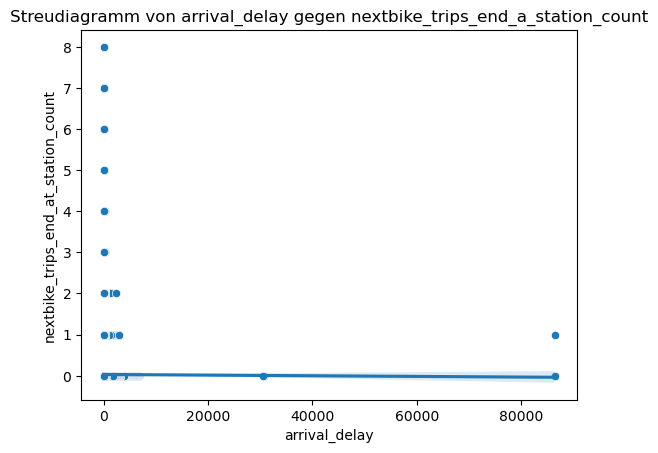

In [156]:
sns.scatterplot(x='arrival_delay', y='nextbike_trips_end_at_station_count', data=delay)
sns.regplot(x='arrival_delay', y='nextbike_trips_end_at_station_count', data=delay, scatter=False)
plt.title('Streudiagramm von arrival_delay gegen nextbike_trips_end_a_station_count')
plt.show()

# Pairplot

In [ ]:
# Pairplot
# Zeigt Beziehung zwischen allen numerischen Variablen
# kombiniert Histogramme und Streudiagramme
sns.pairplot(delay)
plt.show()

In [ ]:
# Violing plot
# Kombiniert Boxplot und Kernel Density Plot
# Zeigt Verteilung der Daten und ihrer Dichte

sns.violinplot(y=delay['tier_trips_count'])
plt.title('Violinplot von Y')
plt.show()

In [ ]:
# Convert string values to numeric values
data1 = delay.apply(pd.to_numeric, errors='coerce')

# Plot the heatmap
sns.heatmap(data1.corr(), annot=True, cmap='coolwarm')
plt.title('Heatmap of Correlations')
plt.show()

## Statistical Tests

In [ ]:
delay

In [ ]:
delay['tier_trips_count'].fillna(0, inplace=True)

In [ ]:
# Shapiro-Wilk-Test für Normalität
from scipy import stats

stat, p = stats.shapiro(delay['tier_trips_count'])
print('Shapiro-Wilk-Test: Statistik=%.3f, p=%.3f' % (stat, p))

In [ ]:
# Kolmogorov-Smirnov-Test 
stat, p = stats.kstest(delay['tier_trips_count'], 'norm', args=(delay['tier_trips_count'].mean(), delay['tier_trips_count'].std()))
print('Kolmogorov-Smirnov-Test: Statistik=%.3f, p=%.3f' % (stat, p))

In [ ]:
# Anderson-Darling-Test
result = stats.anderson(delay['tier_trips_count'], dist='norm')
print('Anderson-Darling-Test: Statistik=%.3f' % result.statistic)
for i in range(len(result.critical_values)):
    sl, cv = result.significance_level[i], result.critical_values[i]
    print('%.3f: %.3f' % (sl, cv))

In [ ]:
# Chi-Squared-Test
# Histogrammerstellung
hist, bin_edges = np.histogram(delay['tier_trips_count'], bins=10, density=True)

# Anpassung an die Normalverteilung
mu, std = stats.norm.fit(delay['tier_trips_count'])
expected = stats.norm.pdf(bin_edges, mu, std)

# Chi-Quadrat-Test
chi_squared_stat, p = stats.chisquare(hist, expected[:-1])
print('Chi-Quadrat-Test: Statistik=%.3f, p=%.3f' % (chi_squared_stat, p))

In [ ]:
# Convert non-numeric columns to numeric data type
delay1 = delay.apply(pd.to_numeric, errors='coerce')

# Calculate correlation matrix
correlation_matrix = delay1.corr()
print(correlation_matrix)

In [ ]:

# Create correlation matrix
correlation_matrix = correlation_matrix

# Plot correlation matrix as heatmap
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest')
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title('Correlation Matrix')

# Save the plot in high resolution
plt.savefig('correlation_matrix.png', dpi=300)